# DSCI D 699 Independent Study in Data Science Fall 2018

## Advisor: Professor David Crandall

Author: Aniruddha M Godbole

A. In this notebook the Complaint Topic Trait Spaces for the three types of loans (mortgage loan, payday loans and student loans) -are built using Funk SVD and Hybrid methods. 
B. A hyothetical user (me) is asked for his twitter handle and also for relative importance scores for two randomly selected interpretable topic from the interpretable topics (identified from among the 150 topics). If there is an error the cell needs to be run again...(the Twitter API's response could have a problem at times).
C. The Complaint Topic Trait Spaces are  visualized (first two principal components) for that loan and for each lender.
D. The best and the worst lender are indicated. And for this the complaints in the neighborhood of the hypothetical user are divided by the number of branches (proxy for number of retail customers) for that lender. Levenshtein distance is used to find the lender (where available) in the Federal Reserve Statical Release (as the lender names are not identical). 
E. The Complaint Topic Trait Space first principal component if discretized (20 levels) and frequency distribution for each lender is found. An RxC contingency table to be used in SAS 9.4 for applying the Freeman and Halton Exact test is generated.

Note-1: mortBigNet, payBigNet, studBigNet classes have been written using the code of the BilinearNet 
class of the Spotlight Library. Guidance from Maciej Kula on identifying the appropriate class
is acknowledged. And within mortBigNet, payBigNet, studBigNet class the changes to the BilinearNet class code ---as made by me---have been highlighted in comments. Essentially,
I have used multi-layered network using pytorch whereas the BilinearNet class has one layer each of users and items.

Note-2: 4 latent factors and 1 epoch/iteration are adequate (for Funk SVD and Hybrid).

Note-3: Currently, if there are less than 10 lenders in the neighborhood then the best and worst lenders will have an overlap.



In [1]:
#import os
import csv
import pandas as pd
import os
import json
import gzip
import pickle 
import string
import re
from langdetect import detect
import fasttext
import spacy
import matplotlib.pyplot as plt
import gensim
import numpy as np
import pyLDAvis.gensim
import os, re, operator, warnings
from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
from gensim.models.wrappers import LdaMallet
from gensim.corpora import Dictionary
import nltk
from nltk.corpus import sentiwordnet as swn 
from numpy.linalg import norm
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html
from sklearn.neighbors import NearestNeighbors
#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
import Levenshtein
from surprise import SVD
from surprise import Dataset
from surprise.model_selection import cross_validate
# https://surprise.readthedocs.io/en/stable/getting_started.html#load-from-df-example
from surprise import Reader

#https://maciejkula.github.io/spotlight/
import torch
from spotlight.factorization.explicit import ExplicitFactorizationModel
from spotlight.interactions import Interactions
import torch.nn as nn
import torch.nn.functional as F  
from spotlight.layers import ScaledEmbedding, ZeroEmbedding
#http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html
from sklearn import preprocessing
from spotlight.cross_validation import random_train_test_split
from spotlight.evaluation import rmse_score


import random
import twitter
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

C:\Users\agodbole\Anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [ ]:
#api = twitter.Api(consumer_key='consumer_key',consumer_secret='consumer_secret',access_token_key='access_token',access_token_secret='access_token_secret')
api = twitter.Api(consumer_key='____',
                      consumer_secret='____',
                      access_token_key='____',
                      access_token_secret='____')
print(api.VerifyCredentials())

# Conventional Home Mortgage Loan Prediction

Please enter a twitter handle@godboleam
Please give a relative importance score for the topic: Protection against eviction sought
0.03
Please give a relative importance score for the topic: Improper response to refinancing request
0.08
@fchollet Your work is surely a great contribution to society in general and a key building block to many in this f… https://t.co/SGNY4YBtQn https://t.co/njUDtddGUo https://t.co/TOTekkZeRa @kdnuggets Spyder is great python-twitter is lot of fun! https://t.co/OrdBgIJFSw 
Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.0530  0.0528  0.0525  0.0540  0.0531  0.0531  0.0005  
MAE (testset)     0.0124  0.0122  0.0122  0.0123  0.0122  0.0123  0.0001  
Fit time          2.47    3.13    3.12    3.16    3.14    3.00    0.27    
Test time         3.25    3.36    2.89    3.22    2.86    3.12    0.20    


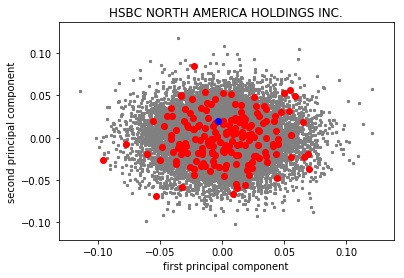

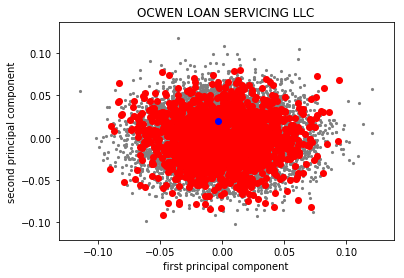

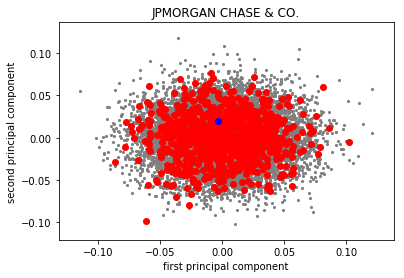

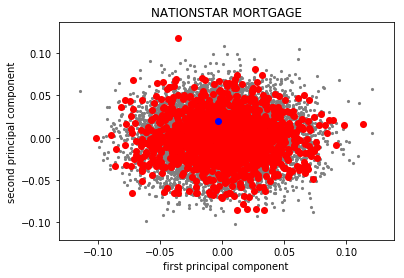

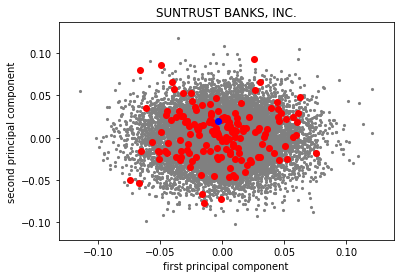

...

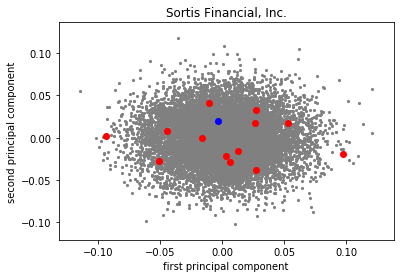

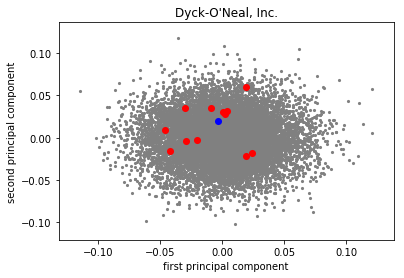

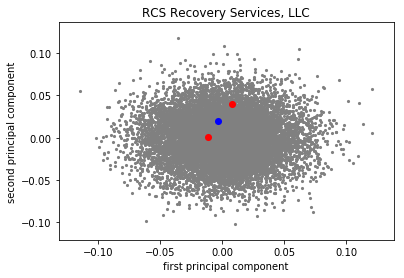

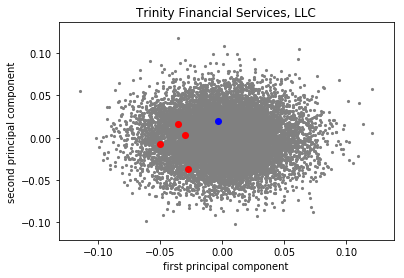

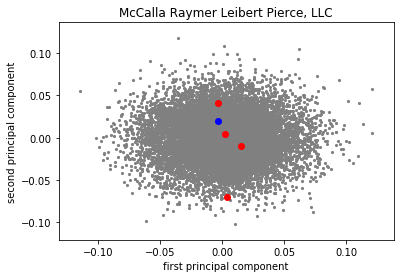

You may want to explore the following lenders:
['ASSOCIATED BANK, NATIONAL ASSOCIATION' 'KEYCORP'
 'FIRST CITIZENS BANCSHARES, INC.' 'BMO HARRIS BANK NATIONAL ASSOCIATION'
 'BB&T CORPORATION']


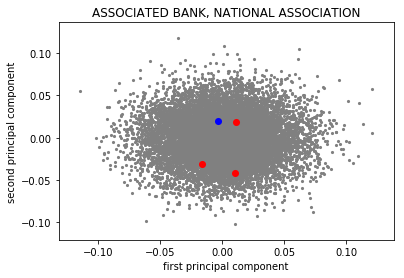

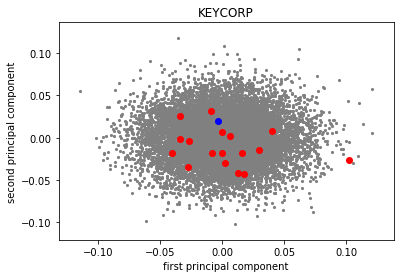

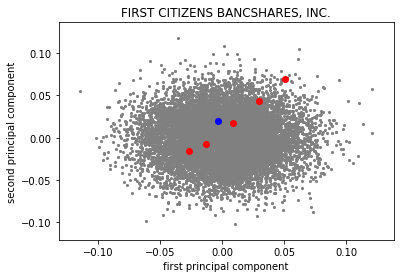

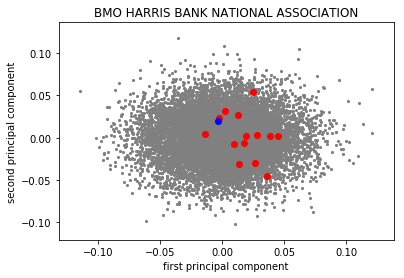

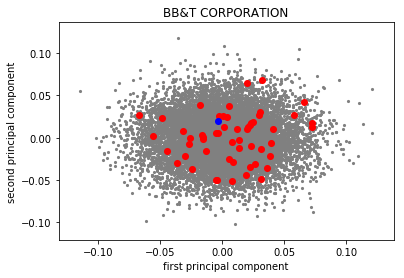

You may want to avoid the following lenders:
['Seterus, Inc.' 'SELECT PORTFOLIO SERVICING, INC.' 'Ditech Financial LLC'
 'NATIONSTAR MORTGAGE' 'OCWEN LOAN SERVICING LLC']


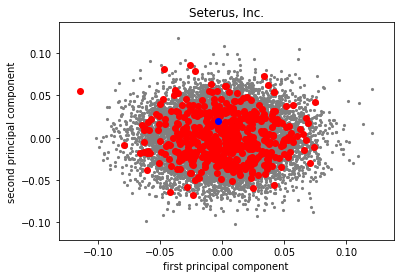

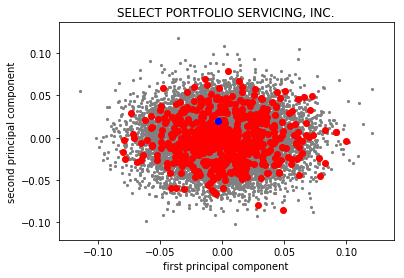

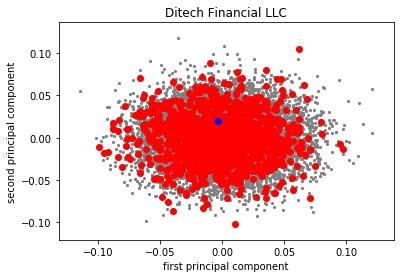

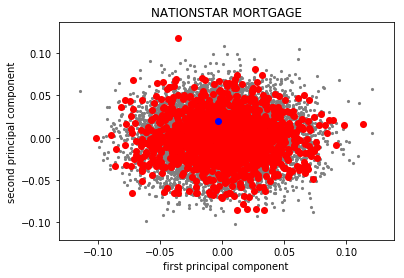

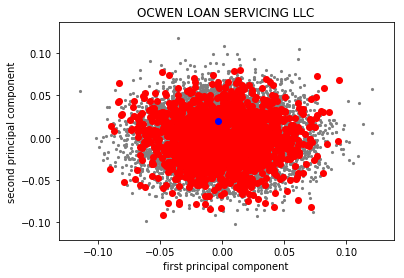

In [3]:
payday_hdpmodel=HdpModel.load('./data/payday_hdpmodel')
student_hdpmodel=HdpModel.load('./data/student_hdpmodel')
mortgage_hdpmodel=HdpModel.load('./data/mortgage_hdpmodel')


#https://github.com/bhargavvader/personal/blob/master/notebooks/text_analysis_tutorial/topic_modelling.ipynb
#https://www.youtube.com/watch?v=ZkAFJwi-G98
nlp = spacy.load('en_core_web_sm')


#See Week#9 Notebook and Word document 'DraftMortgagePaydayStudentLoanComplaintTopicInterpretations.docx' with draft topic interpretations
mortproddebtcoll_draftinterpretable_topics={73:'Seeking modification of co-borrower',112:'Improper response to refinancing request',79: 'Seeking additional finance due to increase in construction costs',3:'Mis-selling of loan',132:'Harassed by the lender',119:'Lender official is unprincipled',13:'Rights under bankruptcy not respected',7:'Protection against eviction sought',9:'Disturbance by the lender'}

payproddebtcoll_draftinterpretable_topics={12:'Eligibility assessment unsatisfactory',120:'Harassed for overdue payments',104:'Seeking protection from intimidation by collection agencies',24:'Mis-selling of loan', 119:'Seeking modification of loan due to personal emergency',85:'Seeking help for new repayment plan',141: 'Fraudulent advertisement',33:'Need repayment plan because of unemployment'}

studproddebtcoll_draftinterpretable_topics={0: 'Seeking accommodation for personal problems',126:'Want to resolve by court proceedings or by discussion',123:'Despite best efforts failed in my application for modification',22:'Seek accommodation because co-borrower passed away',2:'Want to apply for a program to modify my loan',140:'Problems in making prepayment',139:'Mis-selling of loan',31:'Problems with my application'}


model_complaint_to_tweet=gensim.models.KeyedVectors.load_word2vec_format('./data/tweet_complaint_word_vec/complaint_to_tweet.vec')
model_tweet_word=gensim.models.KeyedVectors.load_word2vec_format('./data/tweet_complaint_word_vec/tweet_word.vec')


#See Week#11 Notebook and Python scripts run on laptop, burrow and BigRed2 for more details related to this cell


def vec_in_cross_domain(word):
    try:
        return model_complaint_to_tweet[word]
    except:
        try:
            return model_tweet_word[word]
        except:
            return np.NaN
        
        
def similarity_in_cross_domain(word_1,word_2):
    #checking for the case where a word vector in an array of np.NaN values or the word is a np.NaN value
    if pd.isnull(pd.Series(word_1)).all():
        return np.NaN
    if pd.isnull(pd.Series(word_2)).all():
        return np.NaN
    
    if type(word_1)==np.ndarray:
        word_vector_1=word_1
    else:
        word_vector_1=vec_in_cross_domain(word_1)

    if pd.isnull(pd.Series(word_vector_1)).all():
        return np.NaN
    
    if type(word_2)==np.ndarray:
        word_vector_2=word_2
    else:
        word_vector_2=vec_in_cross_domain(word_2)

    if pd.isnull(pd.Series(word_vector_2)).all():
        return np.NaN        
    
    return(np.dot(word_vector_1,word_vector_2)/(norm(word_vector_1)*norm(word_vector_2)))

def representative_trait_vec(filepath):
    df_trait=pd.read_csv(filepath)
    df_trait['Word Vector']=df_trait['Word'].apply(lambda x:vec_in_cross_domain(x))
    df_trait.dropna(inplace=True)
    trait_corr_sum=df_trait['Correlation'].sum()
    df_trait['Word Vector adj by correlation']=df_trait['Word Vector']*df_trait['Correlation']/trait_corr_sum
    return df_trait['Word Vector adj by correlation'].sum()

def complaint_trait_est_score(x,trait_rep_vec):
    sum=0
    word_count=1 #intialized as 1 in order to avoid division be zero problem
    for word in nlp(x):
        if not(pd.isnull(pd.Series(vec_in_cross_domain(word.text))).all()): #This is required so that word not part of the cross domain word vector space does not get considered as np.NaN which then means that for such a single word in the complaint text the entire score become an array of np.NaN values (resulting from the similarity computation) 
            word_trait_est_score=similarity_in_cross_domain(word.text,trait_rep_vec)
            sum=sum+word_trait_est_score
            word_count=word_count+1
    return sum/word_count
        
    

dfmortproddebtcoll_common_cos_ratings_traits=pd.read_pickle('./data/dfmortproddebtcoll_common_cos_ratings_traits.pickle')
dfpayproddebtcoll_common_cos_ratings_traits=pd.read_pickle('./data/dfpayproddebtcoll_common_cos_ratings_traits.pickle')
dfstudproddebtcoll_common_cos_ratings_traits=pd.read_pickle('./data/dfstudproddebtcoll_common_cos_ratings_traits.pickle')


############## Creating Interaction object##############

#############  dfmortproddebtcoll_common_cos_ratings_traits has NOT been pickled with reset indices...that causes a problem hence this fix...reset and then drop
dfmortproddebtcoll_common_cos_ratings_traits.reset_index(inplace=True)

dfmortproddebtcoll_common_cos_ratings_traits.drop(columns=['index'],inplace=True) 
############

# '150' is sentiment
product_list=[i for i in range(0,150)]+['Less Extraversion',            'More Extraversion',
                   'More Neuroticism',             'Less Neuroticism',
                 'More Agreeableness',           'Less Agreeableness',
             'More Conscientiousness',       'Less Conscientiousness',
                      'More Openness',                'Less Openness']



#https://stackoverflow.com/questions/24645153/pandas-dataframe-columns-scaling-with-sklearn
#from sklearn import preprocessing
#scaler = preprocessing.StandardScaler()
#df_test[product_list] = scaler.fit_transform(df_test[product_list])


# # No Scaling as RMSE around 1.0 with scaling (when checked with Spotlight)


def get_tweets(twitter_handle):
    return api.GetUserTimeline(user_id=None, screen_name=twitter_handle, since_id=None, max_id=None, count=None, include_rts=False, trim_user=False, exclude_replies=False)


#From Week#10
#The representative traits are as dataframes in the pickles files...need to get 1D array
more_agreeable_rep_vec=pd.read_pickle('./data/more_agreeable_rep_vec.pickle').values.flatten()
less_agreeable_rep_vec=pd.read_pickle('./data/less_agreeable_rep_vec.pickle').values.flatten()
more_conscientious_rep_vec=pd.read_pickle('./data/more_conscientious_rep_vec.pickle').values.flatten()
less_conscientious_rep_vec=pd.read_pickle('./data/less_conscientious_rep_vec.pickle').values.flatten()
more_open_rep_vec=pd.read_pickle('./data/more_open_rep_vec.pickle').values.flatten()
less_open_rep_vec=pd.read_pickle('./data/less_open_rep_vec.pickle').values.flatten()
more_extraversion_rep_vec=pd.read_pickle('./data/more_extraversion_rep_vec.pickle').values.flatten()
less_extraversion_rep_vec=pd.read_pickle('./data/less_extraversion_rep_vec.pickle').values.flatten()
more_neurotic_rep_vec=pd.read_pickle('./data/more_neurotic_rep_vec.pickle').values.flatten()
less_neurotic_rep_vec=pd.read_pickle('./data/less_neurotic_rep_vec.pickle').values.flatten()

def complaint_trait_est_score(x,trait_rep_vec):
    sum=0
    word_count=1 #intialized as 1 in order to avoid division be zero problem
    for word in nlp(x):
        if not(pd.isnull(pd.Series(vec_in_cross_domain(word.text))).all()): #This is required so that word not part of the cross domain word vector space does not get considered as np.NaN which then means that for such a single word in the complaint text the entire score become an array of np.NaN values (resulting from the similarity computation) 
            word_trait_est_score=similarity_in_cross_domain(word.text,trait_rep_vec)
            sum=sum+word_trait_est_score
            word_count=word_count+1
    return sum/word_count


threshold_Levenshtein_score=0.6

def branch_num_levenshtein(y,fed_bank_branch_data):
    fed_bank_branch_data['Levenshtein score']=fed_bank_branch_data['Bank Name / Holding Co Name'].apply(lambda x:Levenshtein.ratio(x,y))
    max_Levenshtein_score=fed_bank_branch_data['Levenshtein score'].max()
    if max_Levenshtein_score>=threshold_Levenshtein_score:
        branch_num=fed_bank_branch_data.loc[fed_bank_branch_data['Levenshtein score']==max_Levenshtein_score]['Domestic Branches.1'].iloc[0]
    else:
        branch_num=1
    return branch_num


############################
df_test_mort=dfmortproddebtcoll_common_cos_ratings_traits.copy()
df_test_1_mort=df_test_mort[product_list]
df_test_1_mort.reset_index(inplace=True)
df_test_2_mort=pd.melt(df_test_1_mort,id_vars='index',var_name='Topic_Trait',value_name='Topic_Trait_score')

def mort_new_user_trait_topic_rel_imp():
    mort_list_interpretable_key_list=list(mortproddebtcoll_draftinterpretable_topics.keys()) 
    topic_mort_1=mort_list_interpretable_key_list[random.randint(0,len(mort_list_interpretable_key_list))]
    topic_mort_2=mort_list_interpretable_key_list[random.randint(0,len(mort_list_interpretable_key_list))]
    if topic_mort_2==topic_mort_1: # So that same topic is not presented to the user
        topic_mort_2=mort_list_interpretable_key_list[random.randint(0,len(mort_list_interpretable_key_list))]
    
    
    twitter_handle=str(input('Please enter a twitter handle'))
    print('Please give a relative importance score for the topic:',mortproddebtcoll_draftinterpretable_topics[topic_mort_1])
    topic_mort_1_rel_imp=np.float32(input())
    print('Please give a relative importance score for the topic:',mortproddebtcoll_draftinterpretable_topics[topic_mort_2
                                                                                                            ])
    topic_mort_2_rel_imp=np.float32(input())
    tweets=get_tweets(twitter_handle)
    tweets_text=''
    for tweet in tweets:
        tweets_text=tweets_text+tweet.text+' '
    print(tweets_text)
    #print(type(tweets_text))
    column_list,score_list=[topic_mort_1,topic_mort_2],[topic_mort_1_rel_imp,topic_mort_2_rel_imp]
    for (trait_rep_vec,trait_rep_name) in [(more_agreeable_rep_vec,'More Agreeableness'),(less_agreeable_rep_vec,'Less Agreeableness'),(more_conscientious_rep_vec,'More Conscientiousness'),(less_conscientious_rep_vec,'Less Conscientiousness'),(more_open_rep_vec,'More Openness'),(less_open_rep_vec,'Less Openness'),(more_extraversion_rep_vec,'More Extraversion'),(less_extraversion_rep_vec,'Less Extraversion'),(more_neurotic_rep_vec,'More Neuroticism'),(less_neurotic_rep_vec,'Less Neuroticism')]:
        column_list.append(trait_rep_name)
        score_list.append(complaint_trait_est_score(tweets_text,trait_rep_vec))
    df2=pd.DataFrame(data=[score_list],columns=column_list)
    return df2

df2_mort=mort_new_user_trait_topic_rel_imp()
df3_mort=pd.melt(df2_mort,var_name='Topic_Trait',value_name='Topic_Trait_score')
new_userid_mort=df_test_2_mort['index'].max()+1
df3_mort['index']=new_userid_mort
df_test_2_mort=df_test_2_mort.append(df3_mort)
df_test_2_mort['Topic_Trait']=df_test_2_mort['Topic_Trait'].astype(str)
algo_mort=SVD(n_factors=4,n_epochs=1)
#https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.rename.html
df_test_1000_mort=df_test_2_mort.rename(index=str, columns={'Topic_Trait': 'itemID', 'Topic_Trait_score': 'rating','index':'userID'})
min_mort,max_mort=df_test_1000_mort['rating'].min(),df_test_1000_mort['rating'].max()
reader_mort = Reader(rating_scale=(min_mort,max_mort))
data_mort = Dataset.load_from_df(df_test_1000_mort[['userID', 'itemID', 'rating']], reader_mort)
cross_validate(algo_mort, data_mort, measures=['RMSE', 'MAE'], cv=5, verbose=True)
df_test_1001_mort=df_test_1000_mort.pivot(index='userID',columns='itemID',values='rating')

#For seeing all values in prediction space
df_test_1001_mort=pd.DataFrame(data=np.dot(algo_mort.pu,np.transpose(algo_mort.qi)),columns=product_list) 
#for item in product_list:
    #df_test_1001_mort[str(item)].ix[new_userid_mort]=algo_mort.predict(new_userid_mort,str(item),verbose=False).est
    
pca_mort = PCA(n_components =20,random_state=100)
#pca_mort = PCA(random_state=100)
pca_mort.fit(df_test_1001_mort.values)
pca_mort.explained_variance_ratio_.sum()

X_pca_mort = pca_mort.transform(df_test_1001_mort.values)

plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_mort=list(df_test_mort['Company'].drop_duplicates())
df_test_1001_mort['Company']=df_test_mort['Company']

for lender_mort in lender_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_mort = NearestNeighbors(n_neighbors=5)

neigh_mort.fit(X_pca_mort[:new_userid_mort, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_mort=df_test_1001_mort['Company'].iloc[list(neigh_mort.radius_neighbors(X_pca_mort[new_userid_mort:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_mort=pd.DataFrame(lender_neighbor_freq_mort)

lender_neighbor_df_mort.reset_index(inplace=True)

lender_neighbor_df_mort=lender_neighbor_df_mort.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_mort['Number of Branches']=lender_neighbor_df_mort['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_mort['Scaled Frequency']=lender_neighbor_df_mort['Frequency']/lender_neighbor_df_mort['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_mort.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_mort=lender_neighbor_df_mort['Company'].values[0:5]
print(recommended_list_mort)

for lender_mort in recommended_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


print('You may want to avoid the following lenders:')
unrecommended_list_mort=lender_neighbor_df_mort['Company'].values[-5:]
print(unrecommended_list_mort)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_mort in unrecommended_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()
    




# Preparing the Funk SVD Mortgage Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [4]:
X_pca_mort[:new_userid_mort, 0].shape,X_pca_mort[:new_userid_mort, 1].shape

((12772,), (12772,))

In [5]:
df_X_pca_mort=pd.DataFrame(X_pca_mort)

In [6]:
df_X_pca_mort

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.033415,-0.019173,-0.031145,-0.033996,0.000000e+00,-6.505213e-19,-5.204170e-18,3.930233e-18,-2.168404e-18,8.673617e-19,-4.119968e-18,2.602085e-18,-4.770490e-18,2.439455e-19,-6.505213e-18,3.577867e-18,-2.168404e-18,-3.903128e-18,5.204170e-18,5.854692e-18
1,0.015779,0.035408,0.013155,0.028384,-1.734723e-18,-4.336809e-19,4.336809e-19,-2.927346e-18,2.602085e-18,-8.673617e-19,2.059984e-18,-4.336809e-18,1.734723e-18,-1.084202e-19,3.469447e-18,-2.602085e-18,-1.301043e-18,1.734723e-18,-1.301043e-18,-4.770490e-18
2,0.018029,-0.031398,0.017718,0.007918,1.301043e-18,0.000000e+00,4.336809e-18,1.517883e-18,-4.336809e-19,3.577867e-18,-4.336809e-19,-2.710505e-19,1.843144e-18,8.673617e-19,1.951564e-18,4.336809e-19,3.469447e-18,-9.757820e-19,-2.330823e-18,-8.673617e-19
3,0.011745,-0.031412,0.005922,0.008265,6.505213e-19,-8.673617e-19,5.556536e-19,1.951564e-18,-1.301043e-18,2.981556e-18,-1.517883e-18,-4.878910e-19,7.860466e-19,-1.951564e-18,6.505213e-19,-4.336809e-19,-8.673617e-19,-1.626303e-18,7.318365e-19,6.505213e-19
4,-0.016341,-0.066547,-0.009546,0.027301,1.951564e-18,-4.336809e-18,-8.673617e-19,0.000000e+00,-6.071532e-18,7.372575e-18,0.000000e+00,-4.336809e-19,-1.301043e-18,-1.301043e-18,-2.059984e-18,-1.734723e-18,1.734723e-18,-7.806256e-18,5.204170e-18,8.673617e-19
5,-0.003163,0.010876,0.013846,-0.049034,1.301043e-18,3.903128e-18,3.794708e-18,-4.336809e-19,2.168404e-18,-2.602085e-18,-8.673617e-19,4.770490e-18,-1.788934e-18,3.469447e-18,-2.602085e-18,1.951564e-18,-3.469447e-18,2.168404e-18,4.336809e-19,4.336809e-19
6,-0.047843,0.045207,-0.002004,0.012995,-4.770490e-18,-5.204170e-18,-5.421011e-18,2.168404e-19,-1.734723e-18,-3.469447e-18,-3.469447e-18,-8.673617e-19,-4.770490e-18,2.818926e-18,-3.035766e-18,-2.602085e-18,-2.818926e-18,2.168404e-18,5.204170e-18,3.035766e-18
7,-0.030988,-0.025098,0.010195,-0.002207,4.336809e-19,-8.673617e-19,-1.301043e-18,3.252607e-18,-1.301043e-18,-1.301043e-18,-4.662069e-18,1.734723e-18,-3.469447e-18,-8.673617e-19,-4.336809e-18,6.505213e-19,-6.505213e-19,-3.469447e-18,4.770490e-18,5.421011e-18
8,-0.007477,0.014947,0.010736,-0.031789,-8.673617e-19,1.301043e-18,1.409463e-18,1.626303e-18,2.168404e-19,-8.673617e-19,-2.602085e-18,-4.336809e-19,-1.951564e-18,2.385245e-18,-3.469447e-18,6.505213e-19,2.602085e-18,3.469447e-18,-8.673617e-19,8.673617e-19
9,0.004926,0.011372,0.015702,-0.007369,-1.490778e-19,7.589415e-19,1.734723e-18,-3.523657e-19,2.114194e-18,-7.589415e-19,-7.589415e-19,1.301043e-18,0.000000e+00,4.336809e-19,6.505213e-19,0.000000e+00,1.517883e-18,1.734723e-18,-1.626303e-18,-1.517883e-18


In [7]:
df_X_pca_mort.iloc[:,0]

0       -0.033415
1        0.015779
2        0.018029
3        0.011745
4       -0.016341
5       -0.003163
6       -0.047843
7       -0.030988
8       -0.007477
9        0.004926
10       0.019548
11       0.017303
12      -0.006122
13       0.014756
14      -0.000529
15      -0.049633
16      -0.012112
17      -0.034180
18       0.011225
19       0.002982
20       0.016635
21      -0.033546
22       0.036323
23      -0.017177
24      -0.036927
25      -0.006193
26      -0.007758
27       0.022753
28       0.009243
29      -0.007002
           ...   
12743   -0.003448
12744    0.014960
12745    0.054648
12746   -0.022004
12747    0.018663
12748   -0.013026
12749    0.046038
12750   -0.011505
12751    0.000815
12752   -0.030264
12753   -0.009132
12754    0.026757
12755   -0.010346
12756    0.003479
12757    0.097700
12758    0.027549
12759    0.006808
12760   -0.093619
12761   -0.019471
12762    0.015891
12763   -0.012234
12764    0.003675
12765    0.024984
12766   -0.017227
12767    0

In [8]:
X_pca_mort[:,0]

array([-0.03341481,  0.01577854,  0.01802868, ..., -0.03187815,
        0.01799114, -0.00313854])

In [9]:
pd.cut(X_pca_mort[:,0],20,retbins=True)

([(-0.0439, -0.0321], (0.0151, 0.0268], (0.0151, 0.0268], (0.00327, 0.0151], (-0.0203, -0.00852], ..., (0.0151, 0.0268], (0.0622, 0.074], (-0.0321, -0.0203], (0.0151, 0.0268], (-0.00852, 0.00327]]
 Length: 12773
 Categories (20, interval[float64]): [(-0.115, -0.103] < (-0.103, -0.091] < (-0.091, -0.0793] < (-0.0793, -0.0675] ... (0.074, 0.0858] < (0.0858, 0.0976] < (0.0976, 0.109] < (0.109, 0.121]],
 array([-0.11486148, -0.10283624, -0.09104679, -0.07925734, -0.06746789,
        -0.05567845, -0.043889  , -0.03209955, -0.0203101 , -0.00852065,
         0.0032688 ,  0.01505825,  0.0268477 ,  0.03863715,  0.0504266 ,
         0.06221605,  0.0740055 ,  0.08579495,  0.0975844 ,  0.10937385,
         0.1211633 ]))

In [10]:
xbins=pd.cut(X_pca_mort[:,0],20,retbins=True)[1]

In [11]:
#pd.cut(df_X_pca_mort.iloc[:,0],bins=xbins),pd.cut(df_X_pca_mort.iloc[:,0],bins=20)

In [12]:
k_bins=20 #number of bins into which each column is discretized
mort_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    mort_bins.append(pd.cut(X_pca_mort[:,column],bins=k_bins,retbins=True)[1])

In [13]:
mort_bins

[array([-0.11486148, -0.10283624, -0.09104679, -0.07925734, -0.06746789,
        -0.05567845, -0.043889  , -0.03209955, -0.0203101 , -0.00852065,
         0.0032688 ,  0.01505825,  0.0268477 ,  0.03863715,  0.0504266 ,
         0.06221605,  0.0740055 ,  0.08579495,  0.0975844 ,  0.10937385,
         0.1211633 ]),
 array([-0.101697  , -0.09055085, -0.07962325, -0.06869564, -0.05776804,
        -0.04684043, -0.03591283, -0.02498523, -0.01405762, -0.00313002,
         0.00779758,  0.01872519,  0.02965279,  0.04058039,  0.051508  ,
         0.0624356 ,  0.0733632 ,  0.08429081,  0.09521841,  0.10614602,
         0.11707362]),
 array([-0.09267094, -0.082409  , -0.07234827, -0.06228754, -0.05222682,
        -0.04216609, -0.03210536, -0.02204463, -0.01198391, -0.00192318,
         0.00813755,  0.01819827,  0.028259  ,  0.03831973,  0.04838046,
         0.05844118,  0.06850191,  0.07856264,  0.08862336,  0.09868409,
         0.10874482]),
 array([-0.09195031, -0.08250389, -0.07324269, -0.06398

In [14]:
mort_freq_dist=[]
for column in range(20): #as there are 20 principal components
    mort_freq_dist.append(pd.cut(X_pca_mort[:,column],bins=mort_bins[column],retbins=False).value_counts())
    

In [15]:
mort_freq_dist[0]

(-0.115, -0.103]          1
(-0.103, -0.091]         13
(-0.091, -0.0793]        35
(-0.0793, -0.0675]      100
(-0.0675, -0.0557]      282
(-0.0557, -0.0439]      512
(-0.0439, -0.0321]      897
(-0.0321, -0.0203]     1378
(-0.0203, -0.00852]    1763
(-0.00852, 0.00327]    1992
(0.00327, 0.0151]      1890
(0.0151, 0.0268]       1532
(0.0268, 0.0386]       1080
(0.0386, 0.0504]        681
(0.0504, 0.0622]        343
(0.0622, 0.074]         167
(0.074, 0.0858]          75
(0.0858, 0.0976]         19
(0.0976, 0.109]           8
(0.109, 0.121]            5
dtype: int64

In [16]:
lender_list_mort

['HSBC NORTH AMERICA HOLDINGS INC.',
 'OCWEN LOAN SERVICING LLC',
 'JPMORGAN CHASE & CO.',
 'NATIONSTAR MORTGAGE',
 'SUNTRUST BANKS, INC.',
 'Selene Finance LP',
 'Seterus, Inc.',
 'SELECT PORTFOLIO SERVICING, INC.',
 'LoanCare, LLC',
 'Shellpoint Partners, LLC',
 'BANK OF AMERICA, NATIONAL ASSOCIATION',
 'SANTANDER BANK, NATIONAL ASSOCIATION',
 'PNC Bank N.A.',
 'Ditech Financial LLC',
 'WELLS FARGO & COMPANY',
 'Specialized Loan Servicing LLC',
 'U.S. BANCORP',
 'M&T BANK CORPORATION',
 'BAYVIEW LOAN SERVICING, LLC',
 'ARVEST BANK GROUP, INC.',
 'PHH Mortgage Services Corporation',
 'RoundPoint Mortgage Servicing Corporation',
 'Servis One, Inc.',
 'CITIBANK, N.A.',
 'KEYCORP',
 'LENDER LIVE',
 'PENNYMAC LOAN SERVICES, LLC.',
 'Real Time Resolutions, Inc.',
 'CARRINGTON MORTGAGE SERVICES, LLC',
 'CITIZENS FINANCIAL GROUP, INC.',
 'CAPITAL ONE FINANCIAL CORPORATION',
 'UNITED SERVICES AUTOMOBILE ASSOCIATION',
 'NAVY FEDERAL CREDIT UNION',
 'Residential Credit Solutions, Inc.',
 'FLAGS

In [17]:
#lender_list_mort[4]

In [18]:
#lender_mort=lender_neighbor_df_mort['Company'].values[5]
#print(lender_mort)

In [19]:
#X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
#X_lender_pca_mort[:,0].shape,X_lender_pca_mort[:,1].shape

In [20]:
#pd.cut(X_lender_pca_mort[:,0],bins=mort_bins[0]).value_counts()

In [21]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
mort_freq_all_lender_dist=[]
for lender_mort in lender_list_mort:
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    mort_freq_lender_dist=[]
    for column in range(20):
        mort_freq_lender_dist.append(pd.cut(X_lender_pca_mort[:,column],bins=mort_bins[column]).value_counts())
    mort_freq_all_lender_dist.append(mort_freq_lender_dist)

In [22]:
lender_list_mort[-1]

'McCalla Raymer Leibert Pierce, LLC'

In [23]:
df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]]

,0,1,2,3,4,5,6,7,8,9,...,Less Extraversion,More Extraversion,More Neuroticism,Less Neuroticism,More Agreeableness,Less Agreeableness,More Conscientiousness,Less Conscientiousness,More Openness,Less Openness
12206,0.005888,-0.001737,0.000620,-0.005407,-0.016185,-0.002427,-0.003406,0.000541,-0.008457,-0.002904,...,-0.016154,0.000548,0.004817,0.007483,-0.002291,0.008695,0.005564,-0.005892,-0.009807,-0.006778
12742,-0.001112,0.000262,0.006807,0.005848,0.008976,0.003685,0.000165,0.001492,-0.001183,0.003832,...,0.003201,-0.002562,0.006579,-0.000351,-0.001120,-0.008426,-0.000454,-0.004418,0.002876,-0.002103
12743,-0.003373,0.001068,0.000645,0.003768,0.010149,0.001919,0.002274,-0.000179,0.004538,0.002209,...,0.009604,-0.001184,-0.001588,-0.003941,0.001157,-0.006087,-0.002913,0.002306,0.005831,0.003532
12744,0.000448,-0.000453,0.002777,0.002877,0.005116,0.001670,-0.003036,0.001847,-0.000650,0.000706,...,-0.000451,0.001696,0.001971,-0.001780,-0.001228,-0.003785,-0.001468,0.000790,0.001551,-0.002212


In [24]:
pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])

array([[ 4.35850036e-03, -6.96442213e-02,  6.03840872e-02,
         1.83733936e-03,  3.46944695e-18,  1.73472348e-18,
         3.03576608e-18,  4.77048956e-18,  1.73472348e-18,
         4.98732999e-18, -7.15573434e-18,  4.77048956e-18,
         2.16840434e-18, -2.60208521e-18,  0.00000000e+00,
        -8.67361738e-19,  0.00000000e+00, -4.77048956e-18,
        -1.73472348e-18,  3.46944695e-18],
       [ 2.07273625e-03,  4.14304773e-03, -2.20372397e-02,
        -4.60989666e-02,  1.30104261e-18,  0.00000000e+00,
         1.08420217e-18, -8.67361738e-19,  6.50521303e-19,
        -1.30104261e-18,  2.16840434e-18,  8.67361738e-19,
        -2.38524478e-18,  3.25260652e-19, -4.33680869e-18,
         2.81892565e-18,  5.20417043e-18,  1.30104261e-18,
         1.83297930e-18, -2.16840434e-19],
       [-3.44835362e-03,  4.06434344e-02, -3.50302140e-02,
        -8.35043610e-03, -1.30104261e-18, -4.33680869e-18,
        -1.30104261e-18,  4.33680869e-19,  0.00000000e+00,
        -4.77048956e-18,  1.7

In [25]:
mort_freq_all_lender_dist[-1][0]

(-0.115, -0.103]       0
(-0.103, -0.091]       0
(-0.091, -0.0793]      0
(-0.0793, -0.0675]     0
(-0.0675, -0.0557]     0
(-0.0557, -0.0439]     0
(-0.0439, -0.0321]     0
(-0.0321, -0.0203]     0
(-0.0203, -0.00852]    0
(-0.00852, 0.00327]    2
(0.00327, 0.0151]      2
(0.0151, 0.0268]       0
(0.0268, 0.0386]       0
(0.0386, 0.0504]       0
(0.0504, 0.0622]       0
(0.0622, 0.074]        0
(0.074, 0.0858]        0
(0.0858, 0.0976]       0
(0.0976, 0.109]        0
(0.109, 0.121]         0
dtype: int64

In [26]:
print(lender_list_mort[4])
mort_freq_all_lender_dist[4][0]

SUNTRUST BANKS, INC.


(-0.115, -0.103]        0
(-0.103, -0.091]        0
(-0.091, -0.0793]       0
(-0.0793, -0.0675]      1
(-0.0675, -0.0557]      5
(-0.0557, -0.0439]      9
(-0.0439, -0.0321]     12
(-0.0321, -0.0203]     19
(-0.0203, -0.00852]    17
(-0.00852, 0.00327]    24
(0.00327, 0.0151]      29
(0.0151, 0.0268]       11
(0.0268, 0.0386]       12
(0.0386, 0.0504]        8
(0.0504, 0.0622]        8
(0.0622, 0.074]         1
(0.074, 0.0858]         1
(0.0858, 0.0976]        0
(0.0976, 0.109]         0
(0.109, 0.121]          0
dtype: int64

In [27]:
pd.DataFrame(mort_freq_all_lender_dist[4][0]).reset_index().reset_index()

,level_0,index,0
0,0,"(-0.115, -0.103]",0
1,1,"(-0.103, -0.091]",0
2,2,"(-0.091, -0.0793]",0
3,3,"(-0.0793, -0.0675]",1
4,4,"(-0.0675, -0.0557]",5
5,5,"(-0.0557, -0.0439]",9
6,6,"(-0.0439, -0.0321]",12
7,7,"(-0.0321, -0.0203]",19
8,8,"(-0.0203, -0.00852]",17
9,9,"(-0.00852, 0.00327]",24


In [28]:
abc=pd.DataFrame(mort_freq_all_lender_dist[4][0]).reset_index().reset_index()

In [29]:
abc['lender']=lender_list_mort[4]

In [30]:
abc.drop(columns=['index'],inplace=True)

In [31]:
abc.shape

(20, 3)

In [32]:
abc[0]

0      0
1      0
2      0
3      1
4      5
5      9
6     12
7     19
8     17
9     24
10    29
11    11
12    12
13     8
14     8
15     1
16     1
17     0
18     0
19     0
Name: 0, dtype: int64

In [33]:
#x=[]

In [34]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_mort)):
    abc=pd.DataFrame(mort_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_mort[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))
    

In [35]:
x

[('HSBC NORTH AMERICA HOLDINGS INC.', '1'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '3'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '4'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '4'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '5'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '5'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '5'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '5'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '5'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS INC.', '6'),
 ('HSBC NORTH AMERICA HOLDINGS I

In [36]:
len(x)

12772

In [37]:
pd.DataFrame(pd.Series(x))

,0
0,"(HSBC NORTH AMERICA HOLDINGS INC., 1)"
1,"(HSBC NORTH AMERICA HOLDINGS INC., 3)"
2,"(HSBC NORTH AMERICA HOLDINGS INC., 4)"
3,"(HSBC NORTH AMERICA HOLDINGS INC., 4)"
4,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
5,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
6,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
7,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
8,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
9,"(HSBC NORTH AMERICA HOLDINGS INC., 6)"


In [38]:
abc2=pd.DataFrame(pd.Series(x))

In [39]:
t1=('Trinity Financial Services, LLC', 10)
t1[0]

'Trinity Financial Services, LLC'

In [40]:
abc2['lender name']=abc2[0].apply(lambda x:x[0])
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])

In [41]:
abc2.to_csv('./data/funksvd_mort_lenders_SAS_FisherExactTest.csv')

# Exploring if Relative Entropy may be used...

import numpy as np
from scipy.stats import entropy

for i in range(len(lender_list_mort)):
    for j in range(len(lender_list_mort)):
        if i!=j:
            pk=mort_freq_all_lender_dist[i][0].values
            qk=mort_freq_all_lender_dist[j][0].values
            print(entropy(pk,qk))

# Relative Entropy seems to be an unsuitable measure because if frequency for any discretized value is zero the relative entropy becomes infinity

# Conventional Home Mortgage Loan Prediction using Neural Network i.e. Hybrid Recommender System

In [42]:
#The mortBigNet class is based on the BilinearNet class in Spotlight library
class mortBigNet(nn.Module):  # Modified by Aniruddha
#class BilinearNet(nn.Module): # Modified by Aniruddha
    """
    Bilinear factorization representation.

    Encodes both users and items as an embedding layer; the score
    for a user-item pair is given by the dot product of the item
    and user latent vectors.

    Parameters
    ----------

    num_users: int
        Number of users in the model.
    num_items: int
        Number of items in the model.
    embedding_dim: int, optional
        Dimensionality of the latent representations.
    user_embedding_layer: an embedding layer, optional
        If supplied, will be used as the user embedding layer
        of the network.
    item_embedding_layer: an embedding layer, optional
        If supplied, will be used as the item embedding layer
        of the network.
    sparse: boolean, optional
        Use sparse gradients.

    """

    def __init__(self, num_users, num_items, embedding_dim=32,
                 user_embedding_layer=None, item_embedding_layer=None, sparse=False):

        #super(BilinearNet, self).__init__() # Modified by Aniruddha
        super(mortBigNet, self).__init__() # Modified by Aniruddha

        self.embedding_dim = embedding_dim

        if user_embedding_layer is not None:
            self.user_embeddings = user_embedding_layer
        else:
            self.user_embeddings = ScaledEmbedding(num_users, embedding_dim*16,
                                                   sparse=sparse) #Modified by Aniruddha

        if item_embedding_layer is not None:
            self.item_embeddings = item_embedding_layer
        else:
            self.item_embeddings = ScaledEmbedding(num_items, embedding_dim*1,
                                                   sparse=sparse) #Modified by Aniruddha
        
        self.user_biases = ZeroEmbedding(num_users, 1, sparse=sparse)
        self.item_biases = ZeroEmbedding(num_items, 1, sparse=sparse)
        
        self.fc10 = nn.Linear(embedding_dim*1, embedding_dim) # Added by Aniruddha
        #self.fc11 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        self.fc1 = nn.Linear(embedding_dim*16, embedding_dim*4) # Added by Aniruddha
        self.fc2 = nn.Linear(embedding_dim*4, embedding_dim) # Added by Aniruddha
        self.fc3 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        
        
    def forward(self, user_ids, item_ids):
        """
        Compute the forward pass of the representation.

        Parameters
        ----------

        user_ids: tensor
            Tensor of user indices.
        item_ids: tensor
            Tensor of item indices.

        Returns
        -------

        predictions: tensor
            Tensor of predictions.
        """

        user_embedding = self.user_embeddings(user_ids)
        item_embedding = self.item_embeddings(item_ids)
        
        user_embedding=F.relu(self.fc1(user_embedding)) # Added by Aniruddha
        user_embedding=F.relu(self.fc2(user_embedding)) # Added by Aniruddha 
        user_embedding=F.relu(self.fc3(user_embedding)) # Added by Aniruddha
        
        
        item_embedding=F.relu(self.fc10(item_embedding)) # Added by Aniruddha
        #item_embedding=F.relu(self.fc11(item_embedding)) # Added by Aniruddha

        user_embedding = user_embedding.squeeze()
        item_embedding = item_embedding.squeeze()

        user_bias = self.user_biases(user_ids).squeeze()
        item_bias = self.item_biases(item_ids).squeeze()
        

        dot = (user_embedding * item_embedding).sum(1)

        return dot + user_bias + item_bias

In [43]:
model_hybrid_mort = ExplicitFactorizationModel(loss='regression',
                                   embedding_dim=4,  # latent dimensionality
                                   n_iter=1, 
                                   batch_size=12773,
                                   #l2=1e-9,  # strength of L2 regularization
                                   l2=1e-2,  # strength of L2 regularization
                                   #learning_rate=1e-3,
                                   learning_rate=1e-2,
                                   use_cuda=torch.cuda.is_available(),
                                   representation=mortBigNet(num_users=new_userid_mort+1,num_items=160,embedding_dim=4),
                                   random_state=0)

In [44]:
mort_user_ids=df_test_2_mort['index'].values
mort_item_ids=df_test_2_mort['Topic_Trait'].values
le_mort = preprocessing.LabelEncoder()
le_mort.fit(mort_item_ids)
mort_item_ids=le_mort.transform(mort_item_ids) 

mort_ratings=df_test_2_mort['Topic_Trait_score'].values
#https://stackoverflow.com/questions/45955186/convert-numpy-array-type-and-values-from-float64-to-float32
mort_ratings=np.float32(mort_ratings)
mort_data=Interactions(user_ids=mort_user_ids,item_ids=mort_item_ids, ratings=mort_ratings)



mort_train, mort_test = random_train_test_split(mort_data,test_percentage=0.2,random_state=np.random.RandomState(0))


print('Split into \n {} and \n {}.'.format(mort_train, mort_test))

model_hybrid_mort.fit(mort_train, verbose=True)

mort_train_rmse = rmse_score(model_hybrid_mort, mort_train)
mort_test_rmse = rmse_score(model_hybrid_mort, mort_test)

print('Train RMSE {:.3f}, test RMSE {:.3f}'.format(mort_train_rmse, mort_test_rmse))

Split into 
 <Interactions dataset (12773 users x 160 items x 1634825 interactions)> and 
 <Interactions dataset (12773 users x 160 items x 408707 interactions)>.
Epoch 0: loss 0.0028983351003262214
Train RMSE 0.054, test RMSE 0.054


In [45]:
model_hybrid_mort._net

mortBigNet(
  (user_embeddings): ScaledEmbedding(12773, 64)
  (item_embeddings): ScaledEmbedding(160, 4)
  (user_biases): ZeroEmbedding(12773, 1)
  (item_biases): ZeroEmbedding(160, 1)
  (fc10): Linear(in_features=4, out_features=4, bias=True)
  (fc1): Linear(in_features=64, out_features=16, bias=True)
  (fc2): Linear(in_features=16, out_features=4, bias=True)
  (fc3): Linear(in_features=4, out_features=4, bias=True)
)

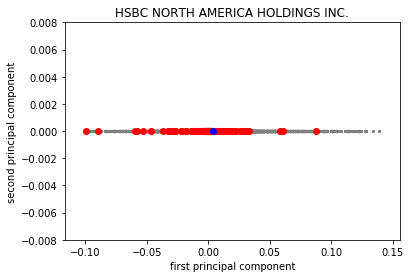

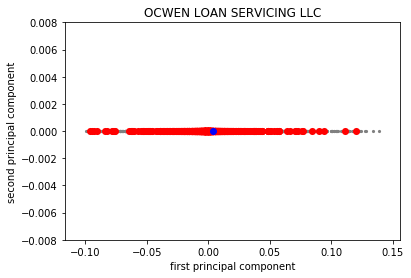

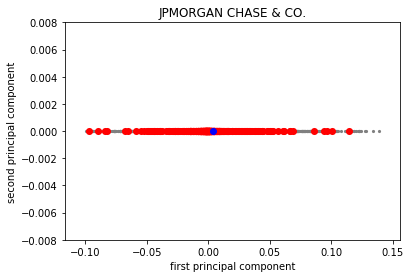

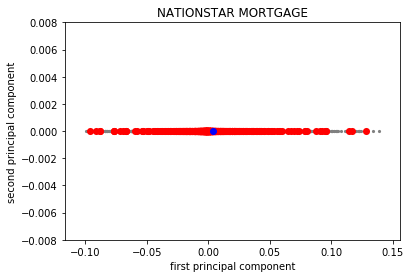

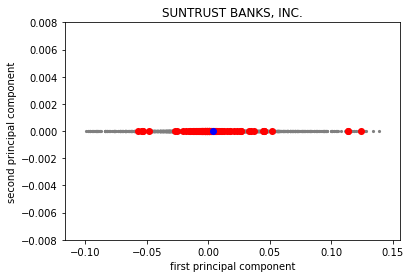

...

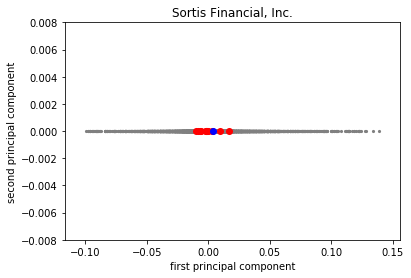

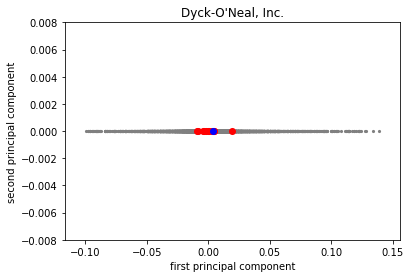

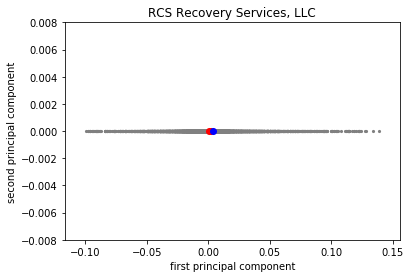

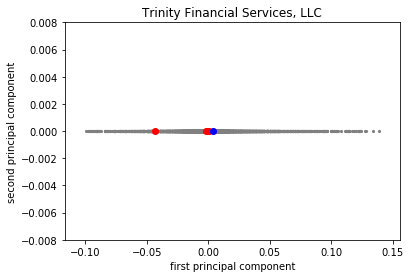

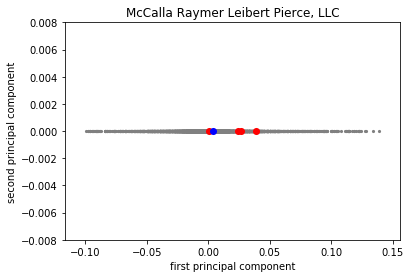

You may want to explore the following lenders:
['FIRST CITIZENS BANCSHARES, INC.' 'ASSOCIATED BANK, NATIONAL ASSOCIATION'
 'KEYCORP' 'BMO HARRIS BANK NATIONAL ASSOCIATION' 'BB&T CORPORATION']


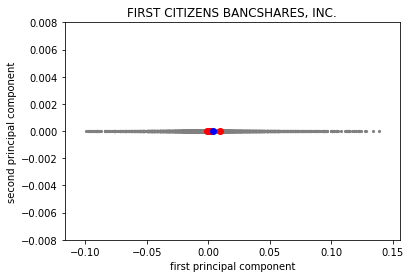

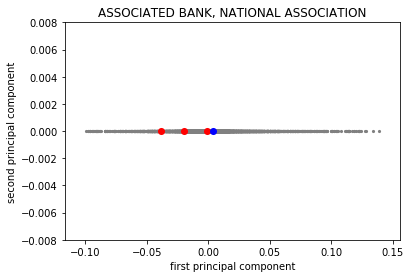

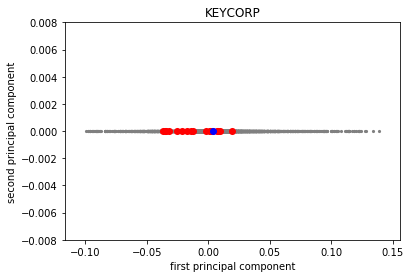

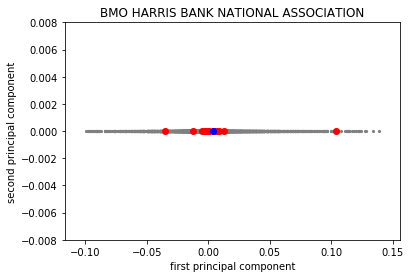

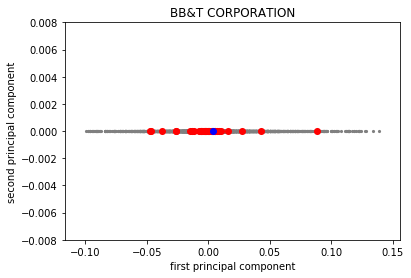

You may want to avoid the following lenders:
['Seterus, Inc.' 'SELECT PORTFOLIO SERVICING, INC.' 'Ditech Financial LLC'
 'NATIONSTAR MORTGAGE' 'OCWEN LOAN SERVICING LLC']


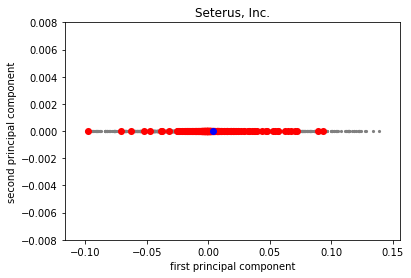

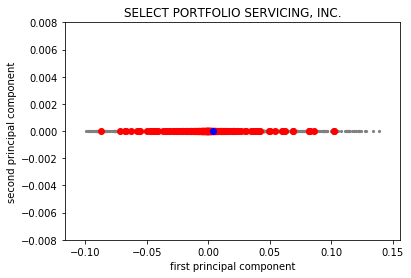

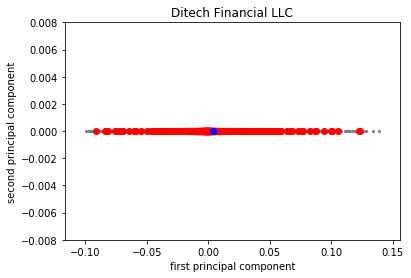

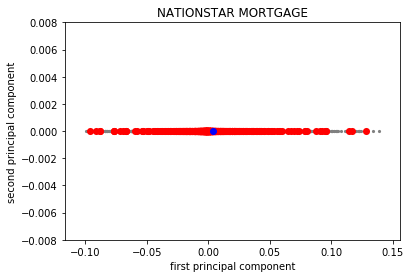

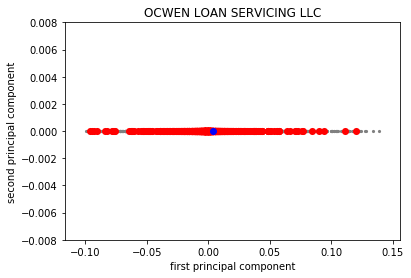

In [46]:
#For seeing all values in prediction space
df_test_1001_mort=pd.DataFrame(data=np.array([model_hybrid_mort.predict(user_id) for user_id in range(new_userid_mort+1)]),columns=product_list) 
#for item in product_list:
    #df_test_1001_mort[str(item)].ix[new_userid_mort]=algo_mort.predict(new_userid_mort,str(item),verbose=False).est
    
pca_mort = PCA(n_components =20,random_state=100)
#pca_mort = PCA(random_state=100)
pca_mort.fit(df_test_1001_mort.values)
pca_mort.explained_variance_ratio_.sum()

X_pca_mort = pca_mort.transform(df_test_1001_mort.values)

plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_mort=list(df_test_mort['Company'].drop_duplicates())
df_test_1001_mort['Company']=df_test_mort['Company']

for lender_mort in lender_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_mort = NearestNeighbors(n_neighbors=5)

neigh_mort.fit(X_pca_mort[:new_userid_mort, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_mort=df_test_1001_mort['Company'].iloc[list(neigh_mort.radius_neighbors(X_pca_mort[new_userid_mort:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_mort=pd.DataFrame(lender_neighbor_freq_mort)

lender_neighbor_df_mort.reset_index(inplace=True)

lender_neighbor_df_mort=lender_neighbor_df_mort.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_mort['Number of Branches']=lender_neighbor_df_mort['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_mort['Scaled Frequency']=lender_neighbor_df_mort['Frequency']/lender_neighbor_df_mort['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_mort.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_mort=lender_neighbor_df_mort['Company'].values[0:5]
print(recommended_list_mort)

for lender_mort in recommended_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


print('You may want to avoid the following lenders:')
unrecommended_list_mort=lender_neighbor_df_mort['Company'].values[-5:]
print(unrecommended_list_mort)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_mort in unrecommended_list_mort:
    plt.title(lender_mort)
    plt.scatter(X_pca_mort[:new_userid_mort, 0], X_pca_mort[:new_userid_mort, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    plt.scatter(X_lender_pca_mort[:,0],X_lender_pca_mort[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_mort[new_userid_mort, 0], X_pca_mort[new_userid_mort, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()
    


# Preparing the Hybrid Mortgage Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [47]:
df_X_pca_mort=pd.DataFrame(X_pca_mort)
xbins=pd.cut(X_pca_mort[:,0],20,retbins=True)[1]

In [48]:
k_bins=20 #number of bins into which each column is discretized
mort_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    mort_bins.append(pd.cut(X_pca_mort[:,column],bins=k_bins,retbins=True)[1])
mort_bins

[array([-0.09959883, -0.08746125, -0.07556166, -0.06366207, -0.05176248,
        -0.03986289, -0.0279633 , -0.01606372, -0.00416413,  0.00773546,
         0.01963505,  0.03153464,  0.04343423,  0.05533382,  0.06723341,
         0.079133  ,  0.09103259,  0.10293217,  0.11483176,  0.12673135,
         0.13863094]),
 array([1.11757452e-07, 1.15578676e-07, 1.19324974e-07, 1.23071273e-07,
        1.26817571e-07, 1.30563869e-07, 1.34310167e-07, 1.38056465e-07,
        1.41802764e-07, 1.45549062e-07, 1.49295360e-07, 1.53041658e-07,
        1.56787956e-07, 1.60534255e-07, 1.64280553e-07, 1.68026851e-07,
        1.71773149e-07, 1.75519448e-07, 1.79265746e-07, 1.83012044e-07,
        1.86758342e-07]),
 array([-3.62486508e-08, -3.18535371e-08, -2.75446020e-08, -2.32356669e-08,
        -1.89267318e-08, -1.46177968e-08, -1.03088617e-08, -5.99992660e-09,
        -1.69099152e-09,  2.61794355e-09,  6.92687863e-09,  1.12358137e-08,
         1.55447488e-08,  1.98536839e-08,  2.41626189e-08,  2.84715540e

In [49]:
mort_freq_dist=[]
for column in range(20): #as there are 20 principal components
    mort_freq_dist.append(pd.cut(X_pca_mort[:,column],bins=mort_bins[column],retbins=False).value_counts())


In [50]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
mort_freq_all_lender_dist=[]
for lender_mort in lender_list_mort:
    X_lender_pca_mort=pca_mort.transform(df_test_1001_mort.loc[df_test_1001_mort['Company']==lender_mort][df_test_1001_mort.columns[:-1]])
    mort_freq_lender_dist=[]
    for column in range(20):
        mort_freq_lender_dist.append(pd.cut(X_lender_pca_mort[:,column],bins=mort_bins[column]).value_counts())
    mort_freq_all_lender_dist.append(mort_freq_lender_dist)


In [51]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_mort)):
    abc=pd.DataFrame(mort_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_mort[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))


In [52]:
len(x)

12772

In [53]:
pd.DataFrame(pd.Series(x))

,0
0,"(HSBC NORTH AMERICA HOLDINGS INC., 0)"
1,"(HSBC NORTH AMERICA HOLDINGS INC., 0)"
2,"(HSBC NORTH AMERICA HOLDINGS INC., 3)"
3,"(HSBC NORTH AMERICA HOLDINGS INC., 3)"
4,"(HSBC NORTH AMERICA HOLDINGS INC., 3)"
5,"(HSBC NORTH AMERICA HOLDINGS INC., 4)"
6,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
7,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
8,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"
9,"(HSBC NORTH AMERICA HOLDINGS INC., 5)"


In [54]:
abc2=pd.DataFrame(pd.Series(x))
abc2['lender name']=abc2[0].apply(lambda x:x[0])
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])

In [55]:
abc2.to_csv('./data/hybrid_mort_lenders_SAS_FisherExactTest.csv')

# Payday Loan Prediction

Please enter a twitter handle@godboleam
Please give a relative importance score for the topic: Eligibility assessment unsatisfactory
0
Please give a relative importance score for the topic: Seeking modification of loan due to personal emergency
0.08
@fchollet Your work is surely a great contribution to society in general and a key building block to many in this f… https://t.co/SGNY4YBtQn https://t.co/njUDtddGUo https://t.co/TOTekkZeRa @kdnuggets Spyder is great python-twitter is lot of fun! https://t.co/OrdBgIJFSw 
Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.0586  0.0585  0.0594  0.0592  0.0573  0.0586  0.0007  
MAE (testset)     0.0188  0.0188  0.0184  0.0189  0.0185  0.0187  0.0002  
Fit time          0.48    0.59    0.62    0.60    0.59    0.58    0.05    
Test time         0.75    0.73    0.44    0.72    0.45    0.62    0.14    


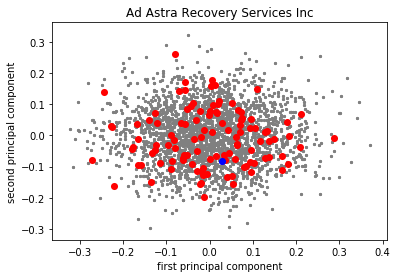

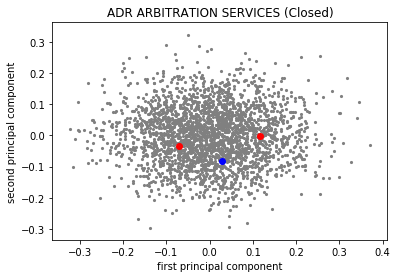

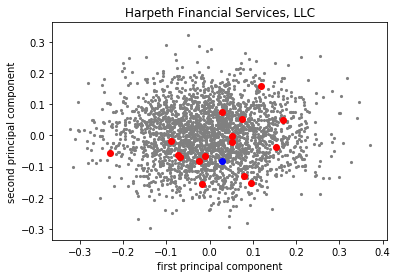

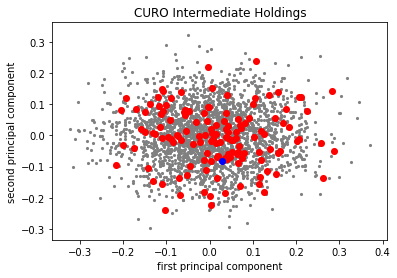

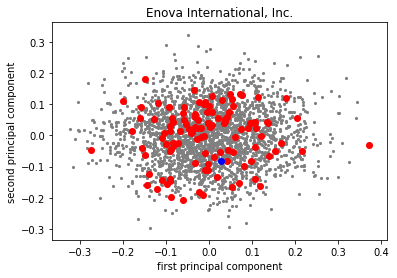

...

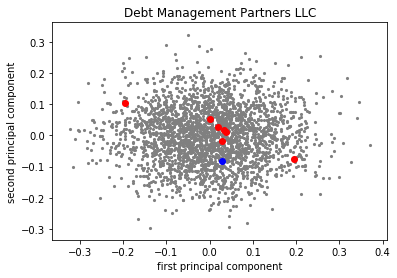

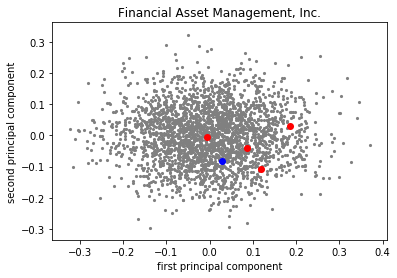

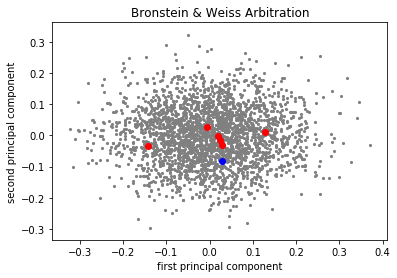

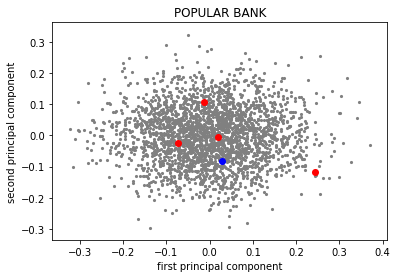

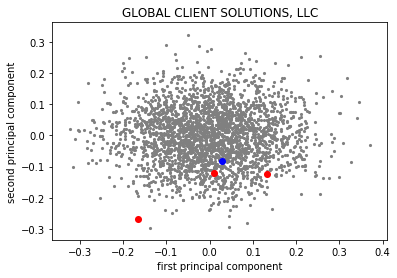

You may want to explore the following lenders:
['J.S Resolution Group, Inc.' 'Wakpamni Lake Community Corporation'
 'CHECK INTO CASH INC.' 'National Financial LLC' 'Risecredit, LLC']


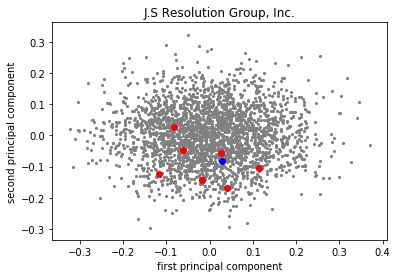

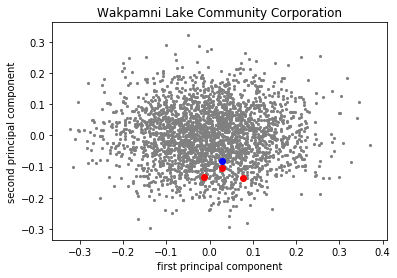

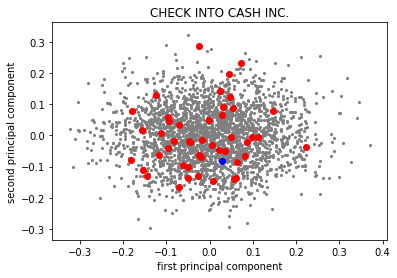

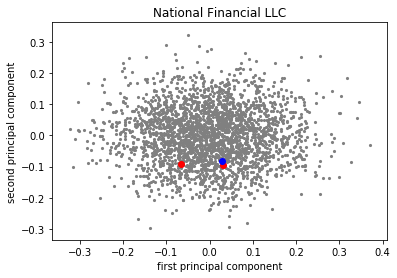

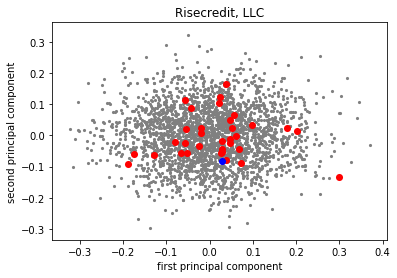

You may want to avoid the following lenders:
['Big Picture Loans, LLC' 'CNG FINANCIAL CORPORATION'
 'ACE CASH EXPRESS, INC.' 'NCB MANAGEMENT SERVICES INC'
 'CURO Intermediate Holdings']


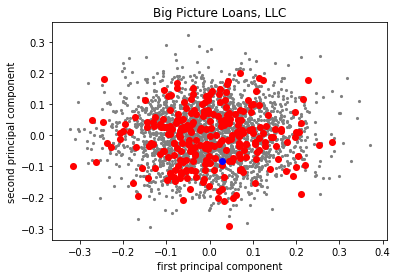

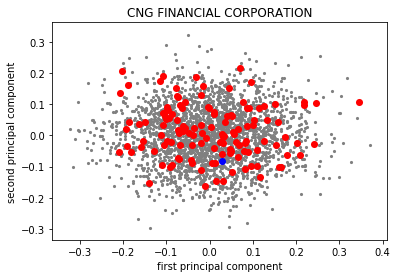

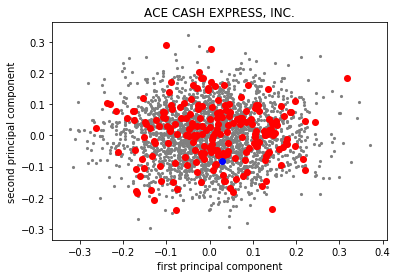

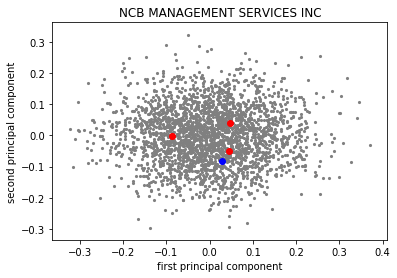

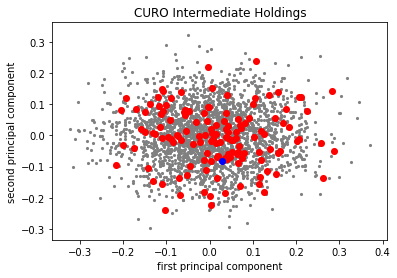

In [56]:
#############  dfpayproddebtcoll_common_cos_ratings_traits has NOT been pickled with reset indices...that causes a problem hence this fix...reset and then drop
dfpayproddebtcoll_common_cos_ratings_traits.reset_index(inplace=True)
dfpayproddebtcoll_common_cos_ratings_traits.drop(columns='index',inplace=True)
############
df_test_pay=dfpayproddebtcoll_common_cos_ratings_traits.copy()
df_test_1_pay=df_test_pay[product_list]
df_test_1_pay.reset_index(inplace=True)
df_test_2_pay=pd.melt(df_test_1_pay,id_vars='index',var_name='Topic_Trait',value_name='Topic_Trait_score')

def pay_new_user_trait_topic_rel_imp():
    pay_list_interpretable_key_list=list(payproddebtcoll_draftinterpretable_topics.keys()) 
    topic_pay_1=pay_list_interpretable_key_list[random.randint(0,len(pay_list_interpretable_key_list))]
    topic_pay_2=pay_list_interpretable_key_list[random.randint(0,len(pay_list_interpretable_key_list))]
    if topic_pay_2==topic_pay_1: # So that same topic is not presented to the user
        topic_pay_2=pay_list_interpretable_key_list[random.randint(0,len(pay_list_interpretable_key_list))]
    
    twitter_handle=str(input('Please enter a twitter handle'))
    print('Please give a relative importance score for the topic:',payproddebtcoll_draftinterpretable_topics[topic_pay_1])
    topic_pay_1_rel_imp=np.float32(input())
    print('Please give a relative importance score for the topic:',payproddebtcoll_draftinterpretable_topics[topic_pay_2
                                                                                                            ])
    topic_pay_2_rel_imp=np.float32(input())
    tweets=get_tweets(twitter_handle)
    tweets_text=''
    for tweet in tweets:
        tweets_text=tweets_text+tweet.text+' '
    print(tweets_text)
    #print(type(tweets_text))
    column_list,score_list=[topic_pay_1,topic_pay_2],[topic_pay_1_rel_imp,topic_pay_2_rel_imp]
    for (trait_rep_vec,trait_rep_name) in [(more_agreeable_rep_vec,'More Agreeableness'),(less_agreeable_rep_vec,'Less Agreeableness'),(more_conscientious_rep_vec,'More Conscientiousness'),(less_conscientious_rep_vec,'Less Conscientiousness'),(more_open_rep_vec,'More Openness'),(less_open_rep_vec,'Less Openness'),(more_extraversion_rep_vec,'More Extraversion'),(less_extraversion_rep_vec,'Less Extraversion'),(more_neurotic_rep_vec,'More Neuroticism'),(less_neurotic_rep_vec,'Less Neuroticism')]:
        column_list.append(trait_rep_name)
        score_list.append(complaint_trait_est_score(tweets_text,trait_rep_vec))
    df2=pd.DataFrame(data=[score_list],columns=column_list)
    return df2

df2_pay=pay_new_user_trait_topic_rel_imp()
df3_pay=pd.melt(df2_pay,var_name='Topic_Trait',value_name='Topic_Trait_score')
new_userid_pay=df_test_2_pay['index'].max()+1
df3_pay['index']=new_userid_pay
df_test_2_pay=df_test_2_pay.append(df3_pay)
df_test_2_pay['Topic_Trait']=df_test_2_pay['Topic_Trait'].astype(str)
algo_pay=SVD(n_factors=4,n_epochs=1)
#https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.rename.html
df_test_1000_pay=df_test_2_pay.rename(index=str, columns={'Topic_Trait': 'itemID', 'Topic_Trait_score': 'rating','index':'userID'})
min_pay,max_pay=df_test_1000_pay['rating'].min(),df_test_1000_pay['rating'].max()
reader_pay = Reader(rating_scale=(min_pay,max_pay))
data_pay = Dataset.load_from_df(df_test_1000_pay[['userID', 'itemID', 'rating']], reader_pay)
cross_validate(algo_pay, data_pay, measures=['RMSE', 'MAE'], cv=5, verbose=True)
df_test_1001_pay=df_test_1000_pay.pivot(index='userID',columns='itemID',values='rating')

#For seeing all values in prediction space
df_test_1001_pay=pd.DataFrame(data=np.dot(algo_pay.pu,np.transpose(algo_pay.qi)),columns=product_list) 
#for item in product_list:
    #df_test_1001_pay[str(item)].ix[new_userid_pay]=algo_pay.predict(new_userid_pay,str(item),verbose=False).est
    
pca_pay = PCA(n_components =20,random_state=100)
#pca_pay = PCA(random_state=100)
pca_pay.fit(df_test_1001_pay.values)
pca_pay.explained_variance_ratio_.sum()

X_pca_pay = pca_pay.transform(df_test_1001_pay.values)

plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_pay=list(df_test_pay['Company'].drop_duplicates())
df_test_1001_pay['Company']=df_test_pay['Company']

for lender_pay in lender_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_pay = NearestNeighbors(n_neighbors=5)

neigh_pay.fit(X_pca_pay[:new_userid_pay, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_pay=df_test_1001_pay['Company'].iloc[list(neigh_pay.radius_neighbors(X_pca_pay[new_userid_pay:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_pay=pd.DataFrame(lender_neighbor_freq_pay)

lender_neighbor_df_pay.reset_index(inplace=True)

lender_neighbor_df_pay=lender_neighbor_df_pay.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_pay['Number of Branches']=lender_neighbor_df_pay['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_pay['Scaled Frequency']=lender_neighbor_df_pay['Frequency']/lender_neighbor_df_pay['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_pay.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_pay=lender_neighbor_df_pay['Company'].values[0:5]
print(recommended_list_pay)

for lender_pay in recommended_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()

print('You may want to avoid the following lenders:')
unrecommended_list_pay=lender_neighbor_df_pay['Company'].values[-5:]
print(unrecommended_list_pay)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_pay in unrecommended_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


# Preparing the Funk SVD Payday Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [57]:
df_X_pca_pay=pd.DataFrame(X_pca_pay)
xbins=pd.cut(X_pca_pay[:,0],20,retbins=True)[1]

In [58]:
k_bins=20 #number of bins into which each column is discretized
pay_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    pay_bins.append(pd.cut(X_pca_pay[:,column],bins=k_bins,retbins=True)[1])
pay_bins

[array([-0.32414269, -0.28872877, -0.25400923, -0.2192897 , -0.18457017,
        -0.14985063, -0.1151311 , -0.08041157, -0.04569203, -0.0109725 ,
         0.02374703,  0.05846657,  0.0931861 ,  0.12790564,  0.16262517,
         0.1973447 ,  0.23206424,  0.26678377,  0.3015033 ,  0.33622284,
         0.37094237]),
 array([-0.29617695, -0.26462894, -0.23369951, -0.20277009, -0.17184066,
        -0.14091124, -0.10998181, -0.07905239, -0.04812296, -0.01719354,
         0.01373589,  0.04466531,  0.07559474,  0.10652417,  0.13745359,
         0.16838302,  0.19931244,  0.23024187,  0.26117129,  0.29210072,
         0.32303014]),
 array([-0.26054099, -0.23088158, -0.20180372, -0.17272586, -0.143648  ,
        -0.11457014, -0.08549228, -0.05641443, -0.02733657,  0.00174129,
         0.03081915,  0.05989701,  0.08897487,  0.11805273,  0.14713058,
         0.17620844,  0.2052863 ,  0.23436416,  0.26344202,  0.29251988,
         0.32159774]),
 array([-0.27753919, -0.24891212, -0.22084637, -0.19278

In [59]:
pay_freq_dist=[]
for column in range(20): #as there are 20 principal components
    pay_freq_dist.append(pd.cut(X_pca_pay[:,column],bins=pay_bins[column],retbins=False).value_counts())

In [60]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
pay_freq_all_lender_dist=[]
for lender_pay in lender_list_pay:
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    pay_freq_lender_dist=[]
    for column in range(20):
        pay_freq_lender_dist.append(pd.cut(X_lender_pca_pay[:,column],bins=pay_bins[column]).value_counts())
    pay_freq_all_lender_dist.append(pay_freq_lender_dist)

In [61]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_pay)):
    abc=pd.DataFrame(pay_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_pay[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))

In [62]:
len(x)

2698

In [63]:
pd.DataFrame(pd.Series(x))

,0
0,"(Ad Astra Recovery Services Inc, 1)"
1,"(Ad Astra Recovery Services Inc, 2)"
2,"(Ad Astra Recovery Services Inc, 2)"
3,"(Ad Astra Recovery Services Inc, 2)"
4,"(Ad Astra Recovery Services Inc, 2)"
5,"(Ad Astra Recovery Services Inc, 4)"
6,"(Ad Astra Recovery Services Inc, 4)"
7,"(Ad Astra Recovery Services Inc, 4)"
8,"(Ad Astra Recovery Services Inc, 4)"
9,"(Ad Astra Recovery Services Inc, 4)"


In [64]:
abc2=pd.DataFrame(pd.Series(x))
abc2['lender name']=abc2[0].apply(lambda x:x[0])
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])

In [65]:
abc2.to_csv('./data/funksvd_pay_lenders_SAS_FisherExactTest.csv')

# Payday Loan Prediction using Neural Network i.e. Hybrid Recommender System

In [66]:
#The payBigNet class is based on the BilinearNet class in Spotlight library
class payBigNet(nn.Module):  # Modified by Aniruddha
#class BilinearNet(nn.Module): # Modified by Aniruddha
    """
    Bilinear factorization representation.

    Encodes both users and items as an embedding layer; the score
    for a user-item pair is given by the dot product of the item
    and user latent vectors.

    Parameters
    ----------

    num_users: int
        Number of users in the model.
    num_items: int
        Number of items in the model.
    embedding_dim: int, optional
        Dimensionality of the latent representations.
    user_embedding_layer: an embedding layer, optional
        If supplied, will be used as the user embedding layer
        of the network.
    item_embedding_layer: an embedding layer, optional
        If supplied, will be used as the item embedding layer
        of the network.
    sparse: boolean, optional
        Use sparse gradients.

    """

    def __init__(self, num_users, num_items, embedding_dim=32,
                 user_embedding_layer=None, item_embedding_layer=None, sparse=False):

        #super(BilinearNet, self).__init__() # Modified by Aniruddha
        super(payBigNet, self).__init__() # Modified by Aniruddha

        self.embedding_dim = embedding_dim

        if user_embedding_layer is not None:
            self.user_embeddings = user_embedding_layer
        else:
            self.user_embeddings = ScaledEmbedding(num_users, embedding_dim*4,
                                                   sparse=sparse) #Modified by Aniruddha

        if item_embedding_layer is not None:
            self.item_embeddings = item_embedding_layer
        else:
            self.item_embeddings = ScaledEmbedding(num_items, embedding_dim*1,
                                                   sparse=sparse) #Modified by Aniruddha
        
        self.user_biases = ZeroEmbedding(num_users, 1, sparse=sparse)
        self.item_biases = ZeroEmbedding(num_items, 1, sparse=sparse)
        
        self.fc10 = nn.Linear(embedding_dim*1, embedding_dim) # Added by Aniruddha
        #self.fc11 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        #self.fc1 = nn.Linear(embedding_dim*16, embedding_dim*4) # Added by Aniruddha
        self.fc2 = nn.Linear(embedding_dim*4, embedding_dim) # Added by Aniruddha
        self.fc3 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        
        
    def forward(self, user_ids, item_ids):
        """
        Compute the forward pass of the representation.

        Parameters
        ----------

        user_ids: tensor
            Tensor of user indices.
        item_ids: tensor
            Tensor of item indices.

        Returns
        -------

        predictions: tensor
            Tensor of predictions.
        """

        user_embedding = self.user_embeddings(user_ids)
        item_embedding = self.item_embeddings(item_ids)
        
        #user_embedding=F.relu(self.fc1(user_embedding)) # Added by Aniruddha
        user_embedding=F.relu(self.fc2(user_embedding)) # Added by Aniruddha 
        user_embedding=F.relu(self.fc3(user_embedding)) # Added by Aniruddha
        
        
        item_embedding=F.relu(self.fc10(item_embedding)) # Added by Aniruddha
        #item_embedding=F.relu(self.fc11(item_embedding)) # Added by Aniruddha

        user_embedding = user_embedding.squeeze()
        item_embedding = item_embedding.squeeze()

        user_bias = self.user_biases(user_ids).squeeze()
        item_bias = self.item_biases(item_ids).squeeze()
        

        dot = (user_embedding * item_embedding).sum(1)

        return dot + user_bias + item_bias

In [67]:
model_hybrid_pay = ExplicitFactorizationModel(loss='regression',
                                   embedding_dim=4,  # latent dimensionality
                                   n_iter=1, 
                                   batch_size=2699,
                                   #l2=1e-9,  # strength of L2 regularization
                                   l2=1e-2,  # strength of L2 regularization
                                   #learning_rate=1e-3,
                                   learning_rate=1e-2,
                                   use_cuda=torch.cuda.is_available(),
                                   representation=payBigNet(num_users=new_userid_pay+1,num_items=160,embedding_dim=4),
                                   random_state=0)

In [68]:
pay_user_ids=df_test_2_pay['index'].values
pay_item_ids=df_test_2_pay['Topic_Trait'].values
le_pay = preprocessing.LabelEncoder()
le_pay.fit(pay_item_ids)
pay_item_ids=le_pay.transform(pay_item_ids) 

pay_ratings=df_test_2_pay['Topic_Trait_score'].values
#https://stackoverflow.com/questions/45955186/convert-numpy-array-type-and-values-from-float64-to-float32
pay_ratings=np.float32(pay_ratings)
pay_data=Interactions(user_ids=pay_user_ids,item_ids=pay_item_ids, ratings=pay_ratings)



pay_train, pay_test = random_train_test_split(pay_data,test_percentage=0.2,random_state=np.random.RandomState(0))


print('Split into \n {} and \n {}.'.format(pay_train, pay_test))

model_hybrid_pay.fit(pay_train, verbose=True)

pay_train_rmse = rmse_score(model_hybrid_pay, pay_train)
pay_test_rmse = rmse_score(model_hybrid_pay, pay_test)

print('Train RMSE {:.3f}, test RMSE {:.3f}'.format(pay_train_rmse, pay_test_rmse))

Split into 
 <Interactions dataset (2699 users x 160 items x 345353 interactions)> and 
 <Interactions dataset (2699 users x 160 items x 86339 interactions)>.
Epoch 0: loss 0.004161194606240315
Train RMSE 0.057, test RMSE 0.059


In [69]:
model_hybrid_pay._net

payBigNet(
  (user_embeddings): ScaledEmbedding(2699, 16)
  (item_embeddings): ScaledEmbedding(160, 4)
  (user_biases): ZeroEmbedding(2699, 1)
  (item_biases): ZeroEmbedding(160, 1)
  (fc10): Linear(in_features=4, out_features=4, bias=True)
  (fc2): Linear(in_features=16, out_features=4, bias=True)
  (fc3): Linear(in_features=4, out_features=4, bias=True)
)

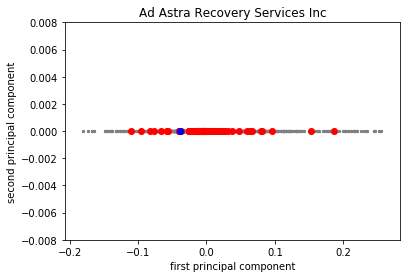

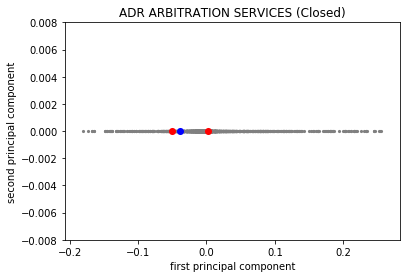

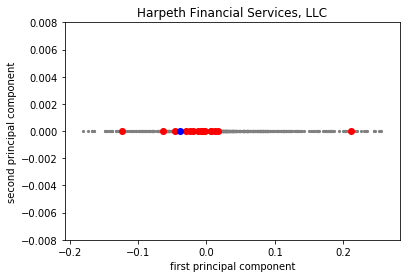

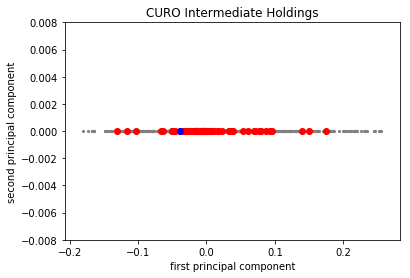

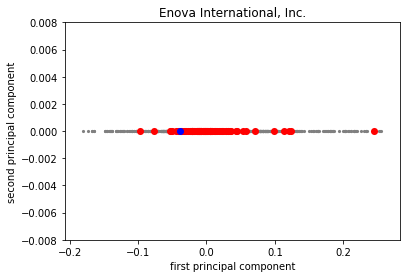

...

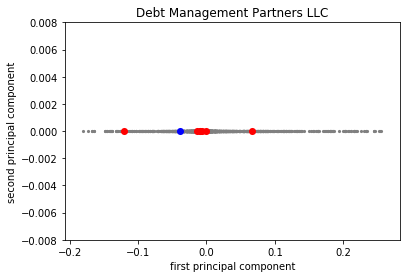

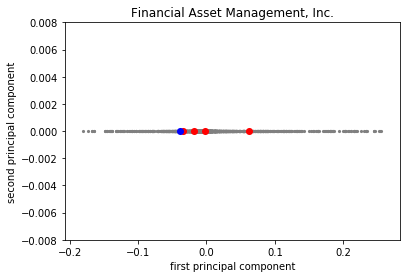

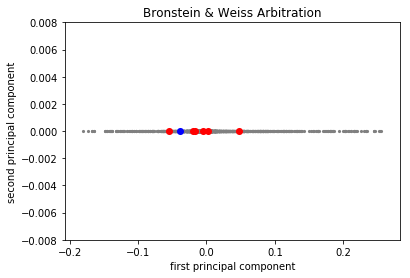

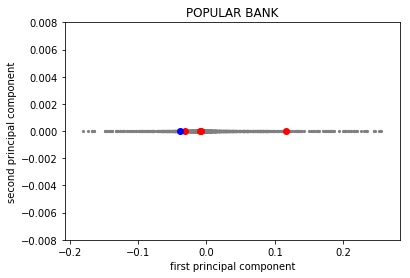

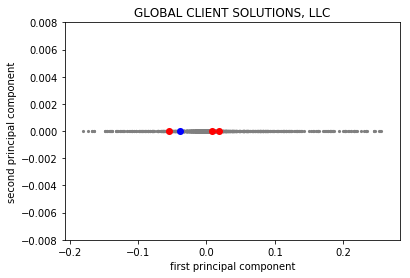

You may want to explore the following lenders:
['WELLS FARGO & COMPANY' 'BANK OF AMERICA, NATIONAL ASSOCIATION'
 'HSBC NORTH AMERICA HOLDINGS INC.' 'CITIBANK, N.A.' 'NPS GROUP']


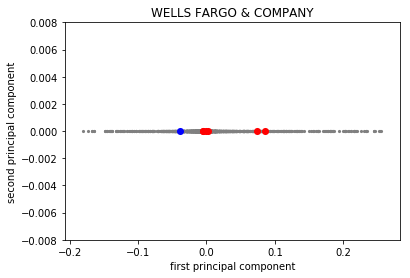

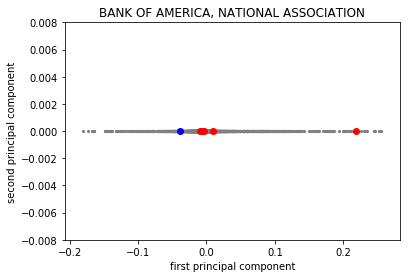

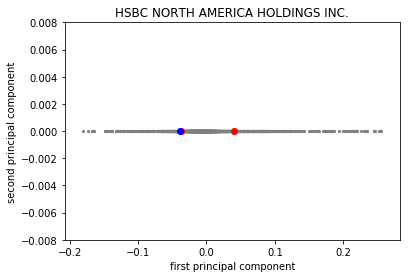

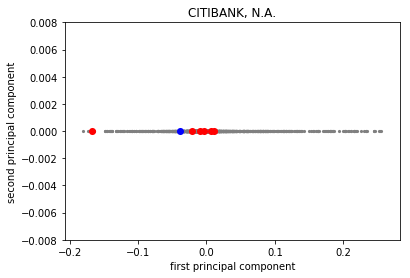

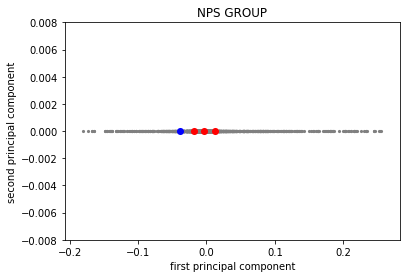

You may want to avoid the following lenders:
['Enova International, Inc.' 'CURO Intermediate Holdings'
 'CNG FINANCIAL CORPORATION' 'Big Picture Loans, LLC'
 'ACE CASH EXPRESS, INC.']


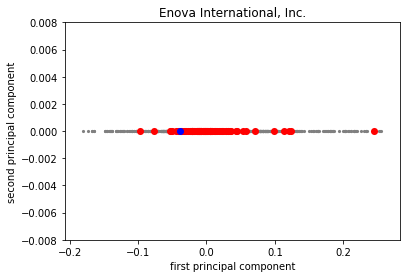

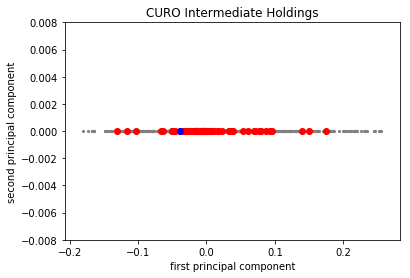

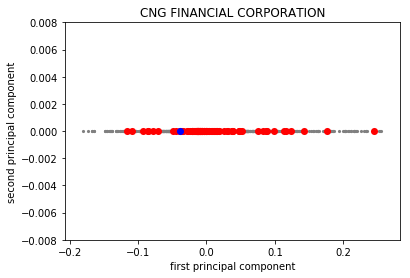

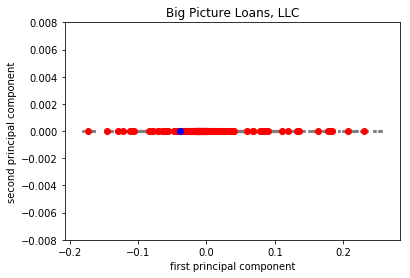

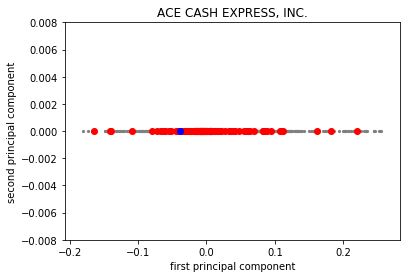

In [70]:
#For seeing all values in prediction space
df_test_1001_pay=pd.DataFrame(data=np.array([model_hybrid_pay.predict(user_id) for user_id in range(new_userid_pay+1)]),columns=product_list) 
#for item in product_list:
    #df_test_1001_pay[str(item)].ix[new_userid_pay]=algo_pay.predict(new_userid_pay,str(item),verbose=False).est
    
pca_pay = PCA(n_components =20,random_state=100)
#pca_pay = PCA(random_state=100)
pca_pay.fit(df_test_1001_pay.values)
pca_pay.explained_variance_ratio_.sum()

X_pca_pay = pca_pay.transform(df_test_1001_pay.values)

plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_pay=list(df_test_pay['Company'].drop_duplicates())
df_test_1001_pay['Company']=df_test_pay['Company']

for lender_pay in lender_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_pay = NearestNeighbors(n_neighbors=5)

neigh_pay.fit(X_pca_pay[:new_userid_pay, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_pay=df_test_1001_pay['Company'].iloc[list(neigh_pay.radius_neighbors(X_pca_pay[new_userid_pay:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_pay=pd.DataFrame(lender_neighbor_freq_pay)

lender_neighbor_df_pay.reset_index(inplace=True)

lender_neighbor_df_pay=lender_neighbor_df_pay.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_pay['Number of Branches']=lender_neighbor_df_pay['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_pay['Scaled Frequency']=lender_neighbor_df_pay['Frequency']/lender_neighbor_df_pay['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_pay.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_pay=lender_neighbor_df_pay['Company'].values[0:5]
print(recommended_list_pay)

for lender_pay in recommended_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


print('You may want to avoid the following lenders:')
unrecommended_list_pay=lender_neighbor_df_pay['Company'].values[-5:]
print(unrecommended_list_pay)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_pay in unrecommended_list_pay:
    plt.title(lender_pay)
    plt.scatter(X_pca_pay[:new_userid_pay, 0], X_pca_pay[:new_userid_pay, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    plt.scatter(X_lender_pca_pay[:,0],X_lender_pca_pay[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_pay[new_userid_pay, 0], X_pca_pay[new_userid_pay, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()
    


# Preparing the Hybrid Payday Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [71]:
df_X_pca_pay=pd.DataFrame(X_pca_pay)
xbins=pd.cut(X_pca_pay[:,0],20,retbins=True)[1]

In [72]:
k_bins=20 #number of bins into which each column is discretized
pay_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    pay_bins.append(pd.cut(X_pca_pay[:,column],bins=k_bins,retbins=True)[1])
pay_bins

[array([-0.18015527, -0.15796382, -0.1362075 , -0.11445117, -0.09269484,
        -0.07093852, -0.04918219, -0.02742586, -0.00566954,  0.01608679,
         0.03784312,  0.05959944,  0.08135577,  0.10311209,  0.12486842,
         0.14662475,  0.16838107,  0.1901374 ,  0.21189373,  0.23365005,
         0.25540638]),
 array([1.02757677e-07, 1.03714935e-07, 1.04653423e-07, 1.05591911e-07,
        1.06530399e-07, 1.07468887e-07, 1.08407375e-07, 1.09345863e-07,
        1.10284351e-07, 1.11222839e-07, 1.12161327e-07, 1.13099815e-07,
        1.14038303e-07, 1.14976791e-07, 1.15915280e-07, 1.16853768e-07,
        1.17792256e-07, 1.18730744e-07, 1.19669232e-07, 1.20607720e-07,
        1.21546208e-07]),
 array([-7.26858661e-09, -6.61232293e-09, -5.96892717e-09, -5.32553142e-09,
        -4.68213566e-09, -4.03873990e-09, -3.39534414e-09, -2.75194838e-09,
        -2.10855262e-09, -1.46515686e-09, -8.21761104e-10, -1.78365345e-10,
         4.65030414e-10,  1.10842617e-09,  1.75182193e-09,  2.39521769e

In [73]:
pay_freq_dist=[]
for column in range(20): #as there are 20 principal components
    pay_freq_dist.append(pd.cut(X_pca_pay[:,column],bins=pay_bins[column],retbins=False).value_counts())


In [74]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
pay_freq_all_lender_dist=[]
for lender_pay in lender_list_pay:
    X_lender_pca_pay=pca_pay.transform(df_test_1001_pay.loc[df_test_1001_pay['Company']==lender_pay][df_test_1001_pay.columns[:-1]])
    pay_freq_lender_dist=[]
    for column in range(20):
        pay_freq_lender_dist.append(pd.cut(X_lender_pca_pay[:,column],bins=pay_bins[column]).value_counts())
    pay_freq_all_lender_dist.append(pay_freq_lender_dist)

In [75]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_pay)):
    abc=pd.DataFrame(pay_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_pay[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))

In [76]:
len(x)

2698

In [77]:
pd.DataFrame(pd.Series(x))

,0
0,"(Ad Astra Recovery Services Inc, 3)"
1,"(Ad Astra Recovery Services Inc, 3)"
2,"(Ad Astra Recovery Services Inc, 4)"
3,"(Ad Astra Recovery Services Inc, 4)"
4,"(Ad Astra Recovery Services Inc, 5)"
5,"(Ad Astra Recovery Services Inc, 5)"
6,"(Ad Astra Recovery Services Inc, 5)"
7,"(Ad Astra Recovery Services Inc, 5)"
8,"(Ad Astra Recovery Services Inc, 6)"
9,"(Ad Astra Recovery Services Inc, 6)"


In [78]:
abc2=pd.DataFrame(pd.Series(x))
abc2['lender name']=abc2[0].apply(lambda x:x[0])
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])


In [79]:
abc2.to_csv('./data/hybrid_pay_lenders_SAS_FisherExactTest.csv')

# Student Loan Prediction

Please enter a twitter handle@godboleam
Please give a relative importance score for the topic: Want to resolve by court proceedings or by discussion
0.15
Please give a relative importance score for the topic: Problems in making prepayment
0.03
@fchollet Your work is surely a great contribution to society in general and a key building block to many in this f… https://t.co/SGNY4YBtQn https://t.co/njUDtddGUo https://t.co/TOTekkZeRa @kdnuggets Spyder is great python-twitter is lot of fun! https://t.co/OrdBgIJFSw 
Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.0542  0.0548  0.0558  0.0550  0.0564  0.0553  0.0008  
MAE (testset)     0.0140  0.0142  0.0147  0.0142  0.0145  0.0143  0.0002  
Fit time          1.66    2.16    2.39    2.27    2.09    2.11    0.25    
Test time         2.47    2.03    2.40    2.00    2.48    2.28    0.22    


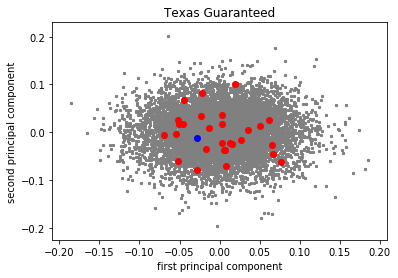

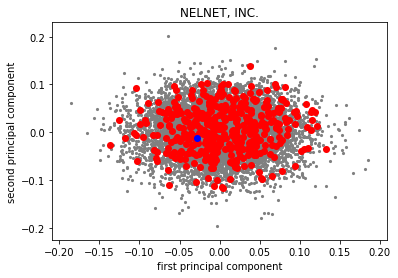

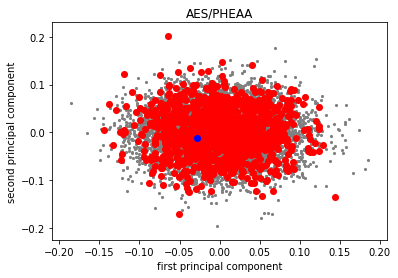

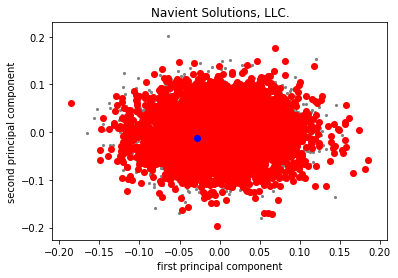

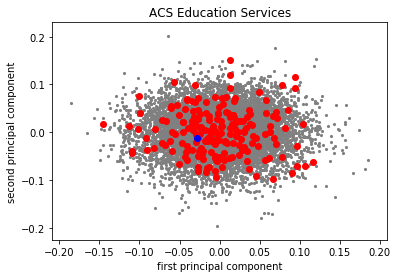

...

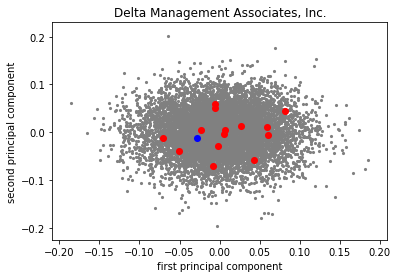

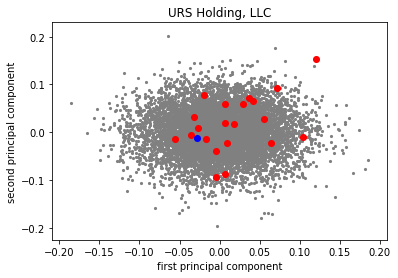

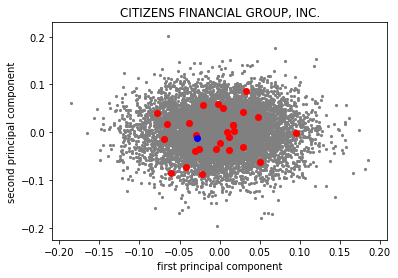

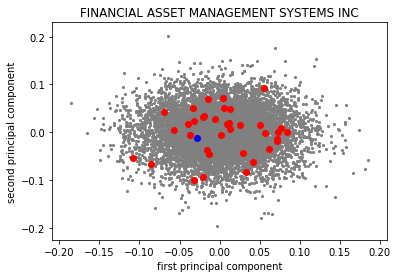

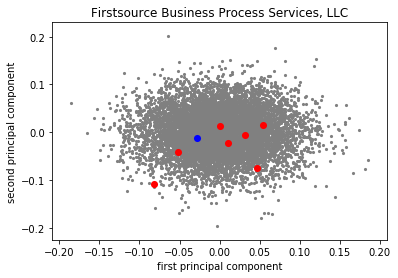

You may want to explore the following lenders:
['WELLS FARGO & COMPANY' 'CITIZENS FINANCIAL GROUP, INC.' 'CITIBANK, N.A.'
 'Account Control Technology, Inc.' 'GC Services Limited Partnership']


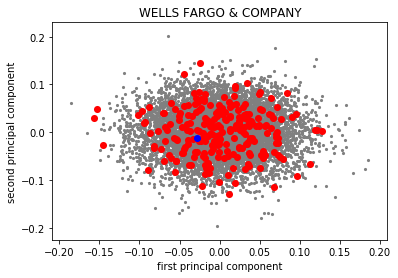

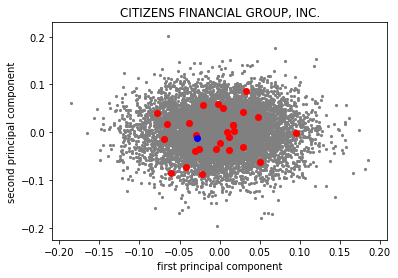

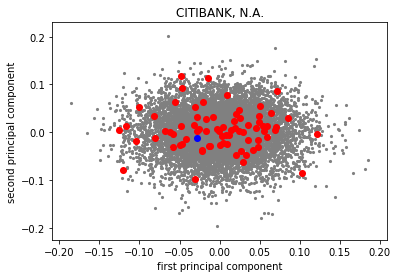

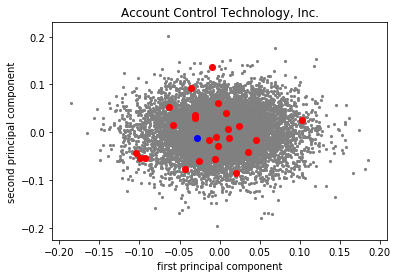

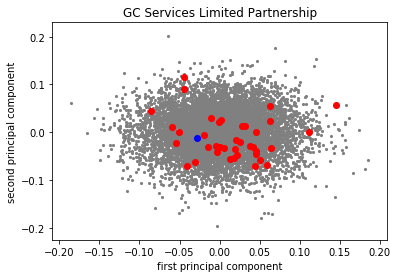

You may want to avoid the following lenders:
['ACS Education Services' 'NELNET, INC.' 'SLM CORPORATION' 'AES/PHEAA'
 'Navient Solutions, LLC.']


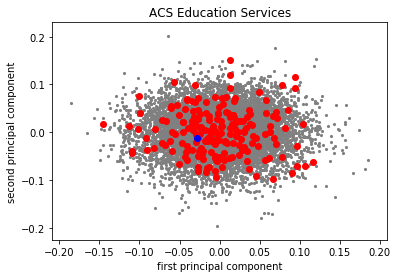

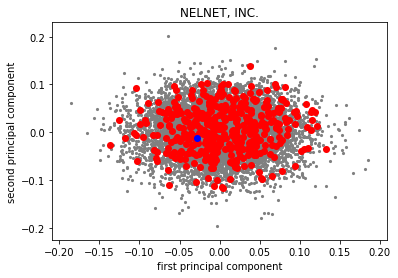

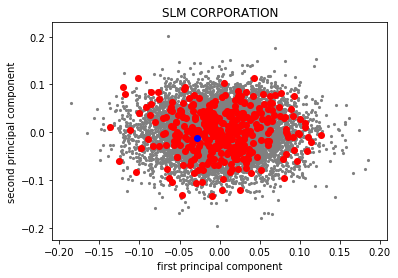

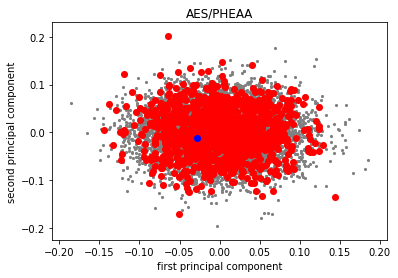

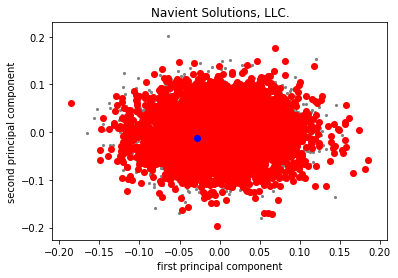

In [81]:
#############  dfstudproddebtcoll_common_cos_ratings_traits has NOT been pickled with reset indices...that causes a problem hence this fix...reset and then drop
dfstudproddebtcoll_common_cos_ratings_traits.reset_index(inplace=True)
dfstudproddebtcoll_common_cos_ratings_traits.drop(columns='index',inplace=True)
############
df_test_stud=dfstudproddebtcoll_common_cos_ratings_traits.copy()
df_test_1_stud=df_test_stud[product_list]
df_test_1_stud.reset_index(inplace=True)
df_test_2_stud=pd.melt(df_test_1_stud,id_vars='index',var_name='Topic_Trait',value_name='Topic_Trait_score')

def stud_new_user_trait_topic_rel_imp():
    stud_list_interpretable_key_list=list(studproddebtcoll_draftinterpretable_topics.keys()) 
    topic_stud_1=stud_list_interpretable_key_list[random.randint(0,len(stud_list_interpretable_key_list))]
    topic_stud_2=stud_list_interpretable_key_list[random.randint(0,len(stud_list_interpretable_key_list))]
    if topic_stud_2==topic_stud_1: # So that same topic is not presented to the user
        topic_stud_2=stud_list_interpretable_key_list[random.randint(0,len(stud_list_interpretable_key_list))]
    
    twitter_handle=str(input('Please enter a twitter handle'))
    print('Please give a relative importance score for the topic:',studproddebtcoll_draftinterpretable_topics[topic_stud_1])
    topic_stud_1_rel_imp=np.float32(input())
    print('Please give a relative importance score for the topic:',studproddebtcoll_draftinterpretable_topics[topic_stud_2
                                                                                                            ])
    topic_stud_2_rel_imp=np.float32(input())
    tweets=get_tweets(twitter_handle)
    tweets_text=''
    for tweet in tweets:
        tweets_text=tweets_text+tweet.text+' '
    print(tweets_text)
    #print(type(tweets_text))
    column_list,score_list=[topic_stud_1,topic_stud_2],[topic_stud_1_rel_imp,topic_stud_2_rel_imp]
    for (trait_rep_vec,trait_rep_name) in [(more_agreeable_rep_vec,'More Agreeableness'),(less_agreeable_rep_vec,'Less Agreeableness'),(more_conscientious_rep_vec,'More Conscientiousness'),(less_conscientious_rep_vec,'Less Conscientiousness'),(more_open_rep_vec,'More Openness'),(less_open_rep_vec,'Less Openness'),(more_extraversion_rep_vec,'More Extraversion'),(less_extraversion_rep_vec,'Less Extraversion'),(more_neurotic_rep_vec,'More Neuroticism'),(less_neurotic_rep_vec,'Less Neuroticism')]:
        column_list.append(trait_rep_name)
        score_list.append(complaint_trait_est_score(tweets_text,trait_rep_vec))
    df2=pd.DataFrame(data=[score_list],columns=column_list)
    return df2

df2_stud=stud_new_user_trait_topic_rel_imp()
df3_stud=pd.melt(df2_stud,var_name='Topic_Trait',value_name='Topic_Trait_score')
new_userid_stud=df_test_2_stud['index'].max()+1
df3_stud['index']=new_userid_stud
df_test_2_stud=df_test_2_stud.append(df3_stud)
df_test_2_stud['Topic_Trait']=df_test_2_stud['Topic_Trait'].astype(str)
algo_stud=SVD(n_factors=4,n_epochs=1)
#https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.rename.html
df_test_1000_stud=df_test_2_stud.rename(index=str, columns={'Topic_Trait': 'itemID', 'Topic_Trait_score': 'rating','index':'userID'})
min_stud,max_stud=df_test_1000_stud['rating'].min(),df_test_1000_stud['rating'].max()
reader_stud = Reader(rating_scale=(min_stud,max_stud))
data_stud = Dataset.load_from_df(df_test_1000_stud[['userID', 'itemID', 'rating']], reader_stud)
cross_validate(algo_stud, data_stud, measures=['RMSE', 'MAE'], cv=5, verbose=True)
df_test_1001_stud=df_test_1000_stud.pivot(index='userID',columns='itemID',values='rating')

#For seeing all values in prediction space
df_test_1001_stud=pd.DataFrame(data=np.dot(algo_stud.pu,np.transpose(algo_stud.qi)),columns=product_list) 
#for item in product_list:
    #df_test_1001_stud[str(item)].ix[new_userid_stud]=algo_stud.predict(new_userid_stud,str(item),verbose=False).est
    
pca_stud = PCA(n_components =20,random_state=100)
#pca_stud = PCA(random_state=100)
pca_stud.fit(df_test_1001_stud.values)
pca_stud.explained_variance_ratio_.sum()

X_pca_stud = pca_stud.transform(df_test_1001_stud.values)

plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_stud=list(df_test_stud['Company'].drop_duplicates())
df_test_1001_stud['Company']=df_test_stud['Company']

for lender_stud in lender_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_stud = NearestNeighbors(n_neighbors=5)

neigh_stud.fit(X_pca_stud[:new_userid_stud, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_stud=df_test_1001_stud['Company'].iloc[list(neigh_stud.radius_neighbors(X_pca_stud[new_userid_stud:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_stud=pd.DataFrame(lender_neighbor_freq_stud)

lender_neighbor_df_stud.reset_index(inplace=True)

lender_neighbor_df_stud=lender_neighbor_df_stud.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_stud['Number of Branches']=lender_neighbor_df_stud['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_stud['Scaled Frequency']=lender_neighbor_df_stud['Frequency']/lender_neighbor_df_stud['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_stud.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_stud=lender_neighbor_df_stud['Company'].values[0:5]
print(recommended_list_stud)

for lender_stud in recommended_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()

print('You may want to avoid the following lenders:')
unrecommended_list_stud=lender_neighbor_df_stud['Company'].values[-5:]
print(unrecommended_list_stud)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_stud in unrecommended_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()
    

# Preparing the Funk SVD Student Loan Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [82]:
df_X_pca_stud=pd.DataFrame(X_pca_stud)
xbins=pd.cut(X_pca_stud[:,0],20,retbins=True)[1]

In [83]:
k_bins=20 #number of bins into which each column is discretized
stud_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    stud_bins.append(pd.cut(X_pca_stud[:,column],bins=k_bins,retbins=True)[1])
stud_bins

[array([-0.18523121, -0.16634106, -0.1478213 , -0.12930155, -0.11078179,
        -0.09226204, -0.07374229, -0.05522253, -0.03670278, -0.01818302,
         0.00033673,  0.01885649,  0.03737624,  0.05589599,  0.07441575,
         0.0929355 ,  0.11145526,  0.12997501,  0.14849476,  0.16701452,
         0.18553427]),
 array([-0.19784724, -0.17746806, -0.15748847, -0.13750888, -0.11752929,
        -0.09754971, -0.07757012, -0.05759053, -0.03761094, -0.01763135,
         0.00234824,  0.02232783,  0.04230742,  0.06228701,  0.0822666 ,
         0.10224619,  0.12222578,  0.14220537,  0.16218496,  0.18216455,
         0.20214414]),
 array([-0.16139149, -0.14447331, -0.12788686, -0.1113004 , -0.09471395,
        -0.0781275 , -0.06154104, -0.04495459, -0.02836814, -0.01178168,
         0.00480477,  0.02139122,  0.03797768,  0.05456413,  0.07115059,
         0.08773704,  0.10432349,  0.12090995,  0.1374964 ,  0.15408285,
         0.17066931]),
 array([-0.13419472, -0.11793131, -0.10198678, -0.08604

In [84]:
stud_freq_dist=[]
for column in range(20): #as there are 20 principal components
    stud_freq_dist.append(pd.cut(X_pca_stud[:,column],bins=stud_bins[column],retbins=False).value_counts())


In [85]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
stud_freq_all_lender_dist=[]
for lender_stud in lender_list_stud:
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    stud_freq_lender_dist=[]
    for column in range(20):
        stud_freq_lender_dist.append(pd.cut(X_lender_pca_stud[:,column],bins=stud_bins[column]).value_counts())
    stud_freq_all_lender_dist.append(stud_freq_lender_dist)

In [86]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_stud)):
    abc=pd.DataFrame(stud_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_stud[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))


In [87]:
len(x)

8687

In [88]:
pd.DataFrame(pd.Series(x))

,0
0,"(Texas Guaranteed, 6)"
1,"(Texas Guaranteed, 7)"
2,"(Texas Guaranteed, 7)"
3,"(Texas Guaranteed, 7)"
4,"(Texas Guaranteed, 7)"
5,"(Texas Guaranteed, 7)"
6,"(Texas Guaranteed, 7)"
7,"(Texas Guaranteed, 8)"
8,"(Texas Guaranteed, 8)"
9,"(Texas Guaranteed, 8)"


In [89]:
abc2=pd.DataFrame(pd.Series(x))
abc2['lender name']=abc2[0].apply(lambda x:x[0])
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])

In [90]:
abc2.to_csv('./data/funksvd_stud_lenders_SAS_FisherExactTest.csv')

# Student Loan Prediction using Neural Network i.e. Hybrid Recommender System

In [91]:
#The studBigNet class is based on the BilinearNet class in Spotlight library
class studBigNet(nn.Module):  # Modified by Aniruddha
#class BilinearNet(nn.Module): # Modified by Aniruddha
    """
    Bilinear factorization representation.

    Encodes both users and items as an embedding layer; the score
    for a user-item pair is given by the dot product of the item
    and user latent vectors.

    Parameters
    ----------

    num_users: int
        Number of users in the model.
    num_items: int
        Number of items in the model.
    embedding_dim: int, optional
        Dimensionality of the latent representations.
    user_embedding_layer: an embedding layer, optional
        If supplied, will be used as the user embedding layer
        of the network.
    item_embedding_layer: an embedding layer, optional
        If supplied, will be used as the item embedding layer
        of the network.
    sparse: boolean, optional
        Use sparse gradients.

    """

    def __init__(self, num_users, num_items, embedding_dim=32,
                 user_embedding_layer=None, item_embedding_layer=None, sparse=False):

        #super(BilinearNet, self).__init__() # Modified by Aniruddha
        super(studBigNet, self).__init__() # Modified by Aniruddha

        self.embedding_dim = embedding_dim

        if user_embedding_layer is not None:
            self.user_embeddings = user_embedding_layer
        else:
            self.user_embeddings = ScaledEmbedding(num_users, embedding_dim*8,
                                                   sparse=sparse) #Modified by Aniruddha

        if item_embedding_layer is not None:
            self.item_embeddings = item_embedding_layer
        else:
            self.item_embeddings = ScaledEmbedding(num_items, embedding_dim*1,
                                                   sparse=sparse) #Modified by Aniruddha
        
        self.user_biases = ZeroEmbedding(num_users, 1, sparse=sparse)
        self.item_biases = ZeroEmbedding(num_items, 1, sparse=sparse)
        
        self.fc10 = nn.Linear(embedding_dim*1, embedding_dim) # Added by Aniruddha
        #self.fc11 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        self.fc1 = nn.Linear(embedding_dim*8, embedding_dim*4) # Added by Aniruddha
        self.fc2 = nn.Linear(embedding_dim*4, embedding_dim) # Added by Aniruddha
        self.fc3 = nn.Linear(embedding_dim, embedding_dim) # Added by Aniruddha
        
        
        
    def forward(self, user_ids, item_ids):
        """
        Compute the forward pass of the representation.

        Parameters
        ----------

        user_ids: tensor
            Tensor of user indices.
        item_ids: tensor
            Tensor of item indices.

        Returns
        -------

        predictions: tensor
            Tensor of predictions.
        """

        user_embedding = self.user_embeddings(user_ids)
        item_embedding = self.item_embeddings(item_ids)
        
        #user_embedding=F.relu(self.fc1(user_embedding)) # Added by Aniruddha
        user_embedding=F.relu(self.fc2(user_embedding)) # Added by Aniruddha 
        user_embedding=F.relu(self.fc3(user_embedding)) # Added by Aniruddha
        
        
        item_embedding=F.relu(self.fc10(item_embedding)) # Added by Aniruddha
        #item_embedding=F.relu(self.fc11(item_embedding)) # Added by Aniruddha

        user_embedding = user_embedding.squeeze()
        item_embedding = item_embedding.squeeze()

        user_bias = self.user_biases(user_ids).squeeze()
        item_bias = self.item_biases(item_ids).squeeze()
        

        dot = (user_embedding * item_embedding).sum(1)

        return dot + user_bias + item_bias

In [92]:
model_hybrid_stud = ExplicitFactorizationModel(loss='regression',
                                   embedding_dim=4,  # latent dimensionality
                                   n_iter=1, 
                                   batch_size=2699,
                                   #l2=1e-9,  # strength of L2 regularization
                                   l2=1e-2,  # strength of L2 regularization
                                   #learning_rate=1e-3,
                                   learning_rate=1e-2,
                                   use_cuda=torch.cuda.is_available(),
                                   representation=payBigNet(num_users=new_userid_stud+1,num_items=160,embedding_dim=4),
                                   random_state=0)

In [93]:
stud_user_ids=df_test_2_stud['index'].values
stud_item_ids=df_test_2_stud['Topic_Trait'].values
le_stud = preprocessing.LabelEncoder()
le_stud.fit(stud_item_ids)
stud_item_ids=le_stud.transform(stud_item_ids) 

stud_ratings=df_test_2_stud['Topic_Trait_score'].values
#https://stackoverflow.com/questions/45955186/convert-numpy-array-type-and-values-from-float64-to-float32
stud_ratings=np.float32(stud_ratings)
stud_data=Interactions(user_ids=stud_user_ids,item_ids=stud_item_ids, ratings=stud_ratings)



stud_train, stud_test = random_train_test_split(stud_data,test_percentage=0.2,random_state=np.random.RandomState(0))


print('Split into \n {} and \n {}.'.format(stud_train, stud_test))

model_hybrid_stud.fit(stud_train, verbose=True)

stud_train_rmse = rmse_score(model_hybrid_stud, stud_train)
stud_test_rmse = rmse_score(model_hybrid_stud, stud_test)

print('Train RMSE {:.3f}, test RMSE {:.3f}'.format(stud_train_rmse, stud_test_rmse))

Split into 
 <Interactions dataset (8688 users x 160 items x 1111945 interactions)> and 
 <Interactions dataset (8688 users x 160 items x 277987 interactions)>.
Epoch 0: loss 0.0031145093925817172
Train RMSE 0.056, test RMSE 0.055


In [94]:
model_hybrid_stud._net

payBigNet(
  (user_embeddings): ScaledEmbedding(8688, 16)
  (item_embeddings): ScaledEmbedding(160, 4)
  (user_biases): ZeroEmbedding(8688, 1)
  (item_biases): ZeroEmbedding(160, 1)
  (fc10): Linear(in_features=4, out_features=4, bias=True)
  (fc2): Linear(in_features=16, out_features=4, bias=True)
  (fc3): Linear(in_features=4, out_features=4, bias=True)
)

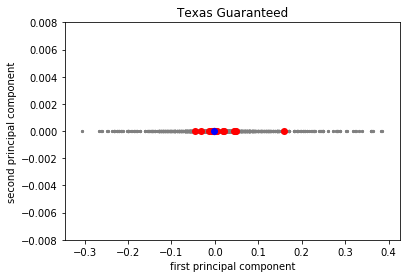

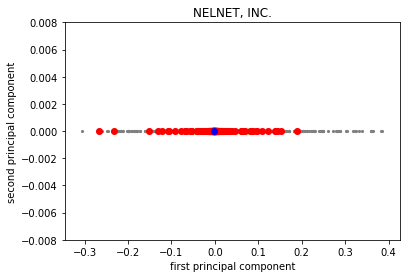

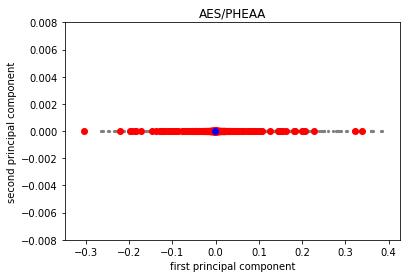

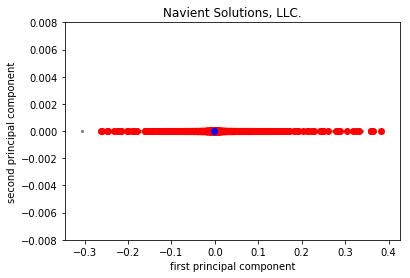

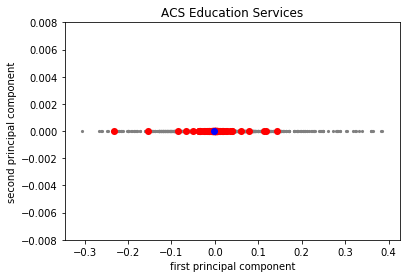

...

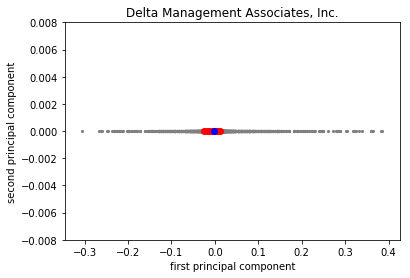

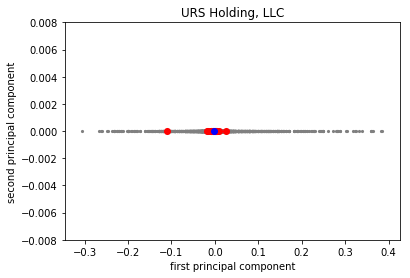

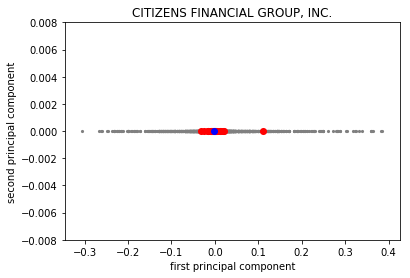

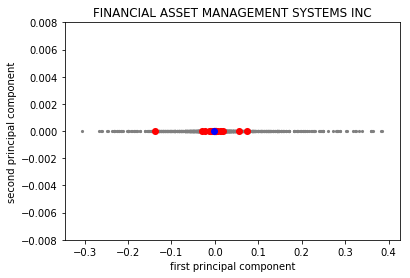

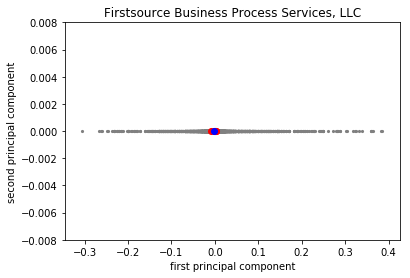

You may want to explore the following lenders:
['CITIZENS FINANCIAL GROUP, INC.' 'WELLS FARGO & COMPANY' 'CITIBANK, N.A.'
 'Alorica Inc.' 'Firstsource Business Process Services, LLC']


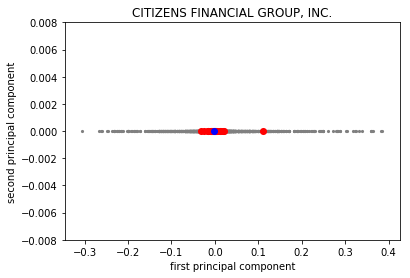

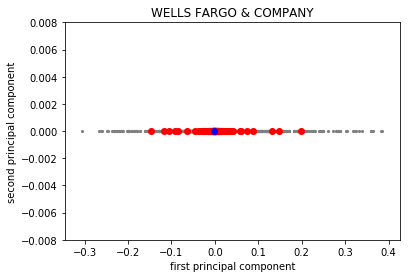

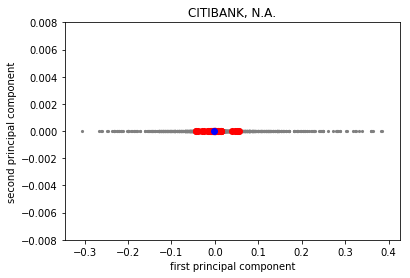

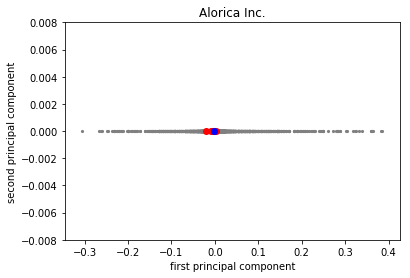

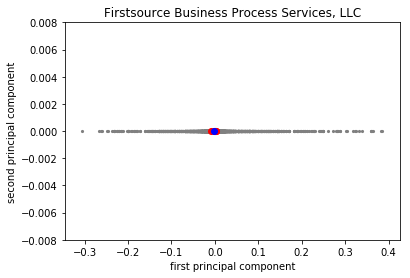

You may want to avoid the following lenders:
['TRANSWORLD SYSTEMS INC' 'SLM CORPORATION' 'NELNET, INC.' 'AES/PHEAA'
 'Navient Solutions, LLC.']


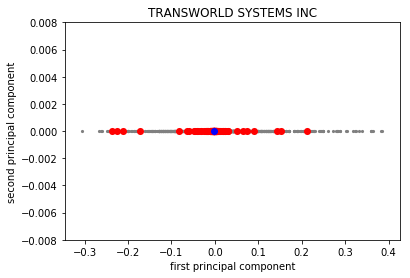

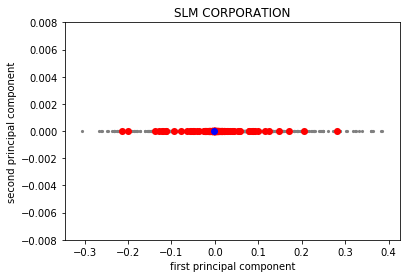

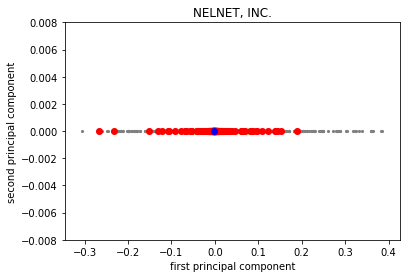

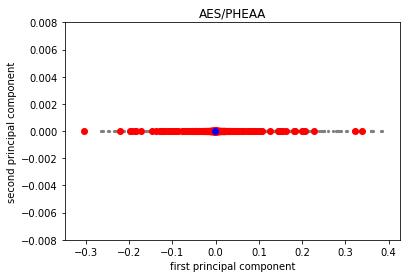

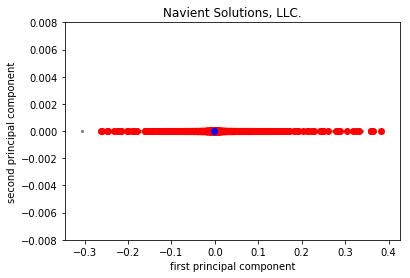

In [95]:
#For seeing all values in prediction space
df_test_1001_stud=pd.DataFrame(data=np.array([model_hybrid_stud.predict(user_id) for user_id in range(new_userid_stud+1)]),columns=product_list) 
#for item in product_list:
    #df_test_1001_stud[str(item)].ix[new_userid_stud]=algo_stud.predict(new_userid_stud,str(item),verbose=False).est
    
pca_stud = PCA(n_components =20,random_state=100)
#pca_stud = PCA(random_state=100)
pca_stud.fit(df_test_1001_stud.values)
pca_stud.explained_variance_ratio_.sum()

X_pca_stud = pca_stud.transform(df_test_1001_stud.values)

plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
plt.xlabel("first principal component")
plt.ylabel("second principal component")

lender_list_stud=list(df_test_stud['Company'].drop_duplicates())
df_test_1001_stud['Company']=df_test_stud['Company']

for lender_stud in lender_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


neigh_stud = NearestNeighbors(n_neighbors=5)

neigh_stud.fit(X_pca_stud[:new_userid_stud, :]) 

# NOTE: For the Bank of America entry in the Federal Reserve data 'AMER' was manually changed to 'AMERICA'. Similary, manual correction may be required...(including for CIT?)...a Levenshtein score is being used...
fed_bank_branch_data=pd.read_excel('./data/FedResLargeCommBankStatRel30June2018.xlsx')


#https://stackoverflow.com/questions/6690739/fuzzy-string-comparison-in-python-confused-with-which-library-to-use
lender_neighbor_freq_stud=df_test_1001_stud['Company'].iloc[list(neigh_stud.radius_neighbors(X_pca_stud[new_userid_stud:, :],0.05,return_distance=False)[0])].value_counts()

lender_neighbor_df_stud=pd.DataFrame(lender_neighbor_freq_stud)

lender_neighbor_df_stud.reset_index(inplace=True)

lender_neighbor_df_stud=lender_neighbor_df_stud.rename(index=str,columns={'index':'Company','Company':'Frequency'})

lender_neighbor_df_stud['Number of Branches']=lender_neighbor_df_stud['Company'].apply(lambda x: branch_num_levenshtein(x,fed_bank_branch_data)+1)

lender_neighbor_df_stud['Scaled Frequency']=lender_neighbor_df_stud['Frequency']/lender_neighbor_df_stud['Number of Branches']

# The number of branches has been taken as a proxy for the number of consumers (retail customers).

#http://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DataFrame.sort_values.html#pandas.DataFrame.sort_values
lender_neighbor_df_stud.sort_values(by=['Scaled Frequency'],ascending=True,inplace=True)


print('You may want to explore the following lenders:')
recommended_list_stud=lender_neighbor_df_stud['Company'].values[0:5]
print(recommended_list_stud)

for lender_stud in recommended_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()


print('You may want to avoid the following lenders:')
unrecommended_list_stud=lender_neighbor_df_stud['Company'].values[-5:]
print(unrecommended_list_stud)

#Note the problem with the names in CPFB data not matching with the Fed Res data means that branches are not properly captured
#and so the unrecommended list may temporarily be dropped
for lender_stud in unrecommended_list_stud:
    plt.title(lender_stud)
    plt.scatter(X_pca_stud[:new_userid_stud, 0], X_pca_stud[:new_userid_stud, 1],c='gray',linewidths=0, s=10)
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    plt.scatter(X_lender_pca_stud[:,0],X_lender_pca_stud[:,1],c='red',linewidths=0, s=50)
    plt.scatter(X_pca_stud[new_userid_stud, 0], X_pca_stud[new_userid_stud, 1],c='blue',linewidths=0, s=50)
    plt.xlabel("first principal component")
    plt.ylabel("second principal component")
    plt.show()
    

# Preparing the Hybrid Student Loan Lender Complaint trait space first principal component data for being used in SAS 9.4 in order to apply Fisher's Exact Test 

In [96]:
df_X_pca_stud=pd.DataFrame(X_pca_stud)
xbins=pd.cut(X_pca_stud[:,0],20,retbins=True)[1]

In [97]:
k_bins=20 #number of bins into which each column is discretized
stud_bins=[] #this specifies the bins for each column
for column in range(20): #as there are 20 principal components
    stud_bins.append(pd.cut(X_pca_stud[:,column],bins=k_bins,retbins=True)[1])
stud_bins

[array([-0.30612899, -0.27086159, -0.2362857 , -0.20170981, -0.16713392,
        -0.13255803, -0.09798214, -0.06340625, -0.02883036,  0.00574553,
         0.04032142,  0.07489731,  0.1094732 ,  0.14404909,  0.17862498,
         0.21320087,  0.24777676,  0.28235265,  0.31692854,  0.35150443,
         0.38608032]),
 array([1.68165252e-07, 1.72453180e-07, 1.76657031e-07, 1.80860881e-07,
        1.85064732e-07, 1.89268583e-07, 1.93472434e-07, 1.97676285e-07,
        2.01880135e-07, 2.06083986e-07, 2.10287837e-07, 2.14491688e-07,
        2.18695538e-07, 2.22899389e-07, 2.27103240e-07, 2.31307091e-07,
        2.35510942e-07, 2.39714792e-07, 2.43918643e-07, 2.48122494e-07,
        2.52326345e-07]),
 array([-1.74826693e-08, -1.60223937e-08, -1.45907509e-08, -1.31591082e-08,
        -1.17274654e-08, -1.02958226e-08, -8.86417988e-09, -7.43253712e-09,
        -6.00089436e-09, -4.56925160e-09, -3.13760884e-09, -1.70596608e-09,
        -2.74323320e-10,  1.15731944e-09,  2.58896220e-09,  4.02060496e

In [98]:
stud_freq_dist=[]
for column in range(20): #as there are 20 principal components
    stud_freq_dist.append(pd.cut(X_pca_stud[:,column],bins=stud_bins[column],retbins=False).value_counts())

In [99]:
#Finding the frequncy distribution for all principal components (discretized) for each lender using 20 bins defined for each principal component across lenders
stud_freq_all_lender_dist=[]
for lender_stud in lender_list_stud:
    X_lender_pca_stud=pca_stud.transform(df_test_1001_stud.loc[df_test_1001_stud['Company']==lender_stud][df_test_1001_stud.columns[:-1]])
    stud_freq_lender_dist=[]
    for column in range(20):
        stud_freq_lender_dist.append(pd.cut(X_lender_pca_stud[:,column],bins=stud_bins[column]).value_counts())
    stud_freq_all_lender_dist.append(stud_freq_lender_dist)

In [100]:
x=[]
#for lender_num in range(4,5):
for lender_num in range(len(lender_list_stud)):
    abc=pd.DataFrame(stud_freq_all_lender_dist[lender_num][0]).reset_index().reset_index()
    abc['lender']=lender_list_stud[lender_num]
    abc.drop(columns=['index'],inplace=True)
    for row in range(abc.shape[0]):
        for freq in range(abc[0][row]):
            x.append((str(abc['lender'][row]),str(abc['level_0'][row])))

In [101]:
len(x)

8687

In [102]:
pd.DataFrame(pd.Series(x))

,0
0,"(Texas Guaranteed, 7)"
1,"(Texas Guaranteed, 7)"
2,"(Texas Guaranteed, 8)"
3,"(Texas Guaranteed, 8)"
4,"(Texas Guaranteed, 8)"
5,"(Texas Guaranteed, 8)"
6,"(Texas Guaranteed, 8)"
7,"(Texas Guaranteed, 8)"
8,"(Texas Guaranteed, 8)"
9,"(Texas Guaranteed, 8)"


In [103]:
abc2=pd.DataFrame(pd.Series(x))
abc2['lender name']=abc2[0].apply(lambda x:str(x[0]))
#https://stackoverflow.com/questions/5843518/remove-all-special-characters-punctuation-and-spaces-from-string
abc2['lender name'].replace('[^A-Za-z0-9]+','',regex=True,inplace=True)
abc2['level']=abc2[0].apply(lambda x:x[1])

In [104]:
abc2.to_csv('./data/hybrid_stud_lenders_SAS_FisherExactTest.csv')